# make_grid:
### Version id:
### GEBCO v2023
### third version: 
#### smoothing + remove islands and slow circulation regions.

In [14]:

run ='seqld'
vers='1km_v2'
plotting = False

import numpy as np 
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
import sys
import xarray as xr
import scipy.io as sio
from scipy.interpolate import griddata
import datetime
import cmocean
# import h5py
import bathy_smoother
# import pyresample
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes

#proj_dir = os.path.join(os.pardir,os.pardir)
proj_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
data_dir = os.path.join(proj_dir,'data')
src_dir = os.path.join(proj_dir,'src')

sys.path.append(src_dir)

from ext.tools.inverse_polar_stereo import inverse_polar_stereo
from ext.tools.cartesian_grid_2d import haversine
from ext.tools.NDinterp import NDinterp
from ext.tools.smoothing_PlusMinus_rx0 import smoothing_PlusMinus_rx0
from ext.tools.uvp_masks import uvp_masks



out_path = os.path.join(data_dir,'proc',run+'_'+vers+'_grd.nc')


# # define coordinate transforms
# ## convert convert polarstereo to lat/lon and vice versa.
# from pyproj import Transformer
# from pyproj import CRS
# ps_to_ll = Transformer.from_crs( "EPSG:3031","EPSG:4326")
# ll_to_ps = Transformer.from_crs( "EPSG:4326","EPSG:3031")

# load my functions for calculating rx0,rx1 and adjusting the grid
# from ext.tools.calc_z import calc_z as calc_z_old
from functions import GridStiffness
from functions.GridAdjustments import adjustWCT,adjustMask,setBathy,smoothBathyPatch

# Set model vertical coordinate settings

N=31
Vtransform=2
Vstretching=4
theta_s=1
theta_b=4
Tcline=20
hc=Tcline # if Vtransform==2, hc=Tcline


In [15]:
#load GEBCO 2023 geometry

gebco_2023_bed = os.path.join(data_dir,'raw','GEBCO_2023','GEBCO_2023_sub_ice_topo.nc')

g23 = xr.load_dataset(gebco_2023_bed)

g23 = g23.sel(lon=slice(149,160),lat=slice(-30,-21))
g23

long,latg = np.meshgrid(g23.lon,g23.lat)
g23 = g23.assign_coords({"longitude": (("lat", "lon"), long), "latitude": (("lat", "lon"), latg)})

# make bathy: (i.e. +ve downwards); with -ve values set to minimum value; values less than min value == min value
min_bathy_thresh = 0.1
g23['bathy_raw']=-g23.elevation
g23['bathy'] = g23.bathy_raw.where(g23.bathy_raw>=min_bathy_thresh,min_bathy_thresh)

# make masks
g23["mask_ocean"]=np.isfinite(g23.elevation.where(g23.elevation<0,np.NaN))

In [16]:
g23

<xarray.Dataset>
Dimensions:     (lon: 2640, lat: 2160)
Coordinates:
  * lon         (lon) float64 149.0 149.0 149.0 149.0 ... 160.0 160.0 160.0
  * lat         (lat) float64 -30.0 -29.99 -29.99 -29.99 ... -21.01 -21.01 -21.0
    longitude   (lat, lon) float64 149.0 149.0 149.0 149.0 ... 160.0 160.0 160.0
    latitude    (lat, lon) float64 -30.0 -30.0 -30.0 -30.0 ... -21.0 -21.0 -21.0
Data variables:
    elevation   (lat, lon) int16 161 161 162 162 161 ... -2123 -2119 -2116 -2113
    bathy_raw   (lat, lon) int16 -161 -161 -162 -162 ... 2123 2119 2116 2113
    bathy       (lat, lon) float64 0.1 0.1 0.1 ... 2.119e+03 2.116e+03 2.113e+03
    mask_ocean  (lat, lon) bool False False False False ... True True True True
Attributes:
    Conventions:  CF-1.6
    title:        The GEBCO_2020 Grid - a continuous terrain model for oceans...
    institution:  On behalf of the General Bathymetric Chart of the Oceans (G...
    source:       The GEBCO_2020 Grid is the latest global bathymetric produc...
    history:      Information on the development of the data set and the sour...
    references:   DOI: 10.5285/836f016a-33be-6ddc-e053-6c86abc0788e
    comment:      The data in the GEBCO_2020 Grid should not be used for navi...
    node_offset:  1.0

<Figure size 640x480 with 0 Axes>

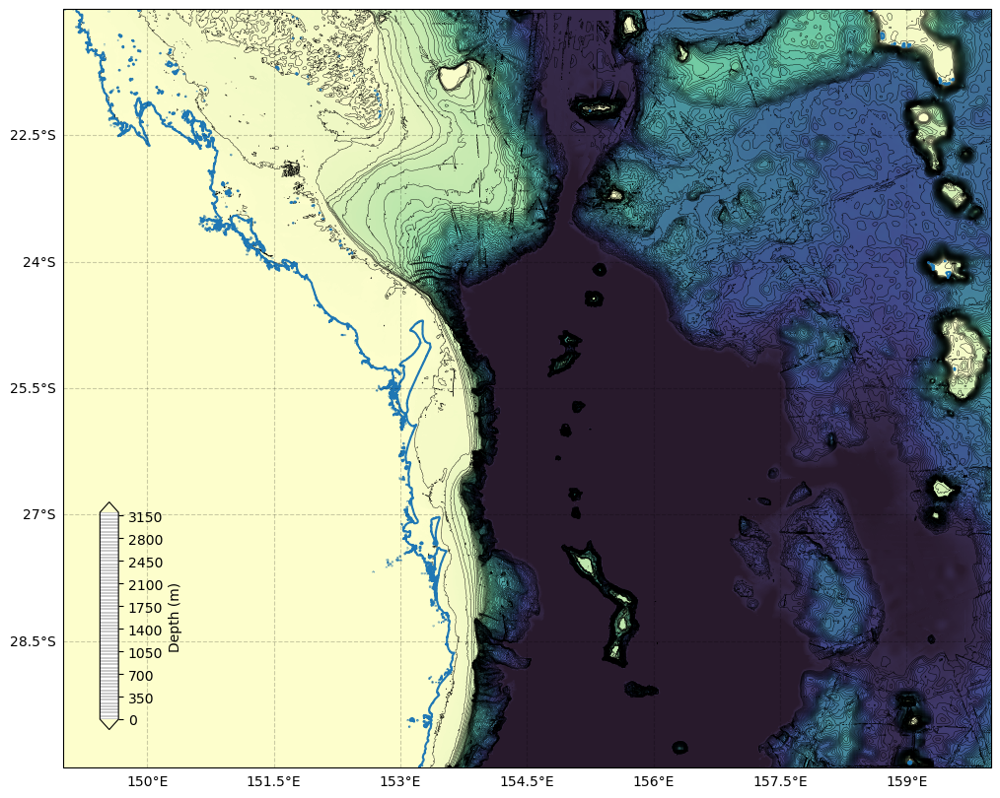

In [17]:
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes

# Create a plot of the bathymetry data using Cartopy
gs = gridspec.GridSpec(nrows=1,ncols=1,wspace=0.05, hspace=0.05)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[15,10])
ax = None

#make an axis and decorate the cartopy stuff
ax = fig.add_subplot(gs[0,0], projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True,color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
# ax.set_extent([64, 80, -75, -62])

#add data
im = (-g23.elevation).plot.pcolormesh(x='lon',y='lat',cmap='cmo.deep',add_colorbar=False,vmin=0,vmax=3500)
im = (-g23.elevation).plot.contour(x='lon',y='lat',colors='k',linewidths=.3,levels=np.array([*np.arange(00,3250,50)]),add_colorbar=False)
co=plt.contour(g23.lon,g23.lat,g23.elevation,levels=np.array([0]),colors='C0')

#add colourbar
cax = inset_axes(ax,
                width="2%",  # width = 10% of parent_bbox width
                height="30%",  # height : 50%
                loc='lower left',
                bbox_to_anchor=(.04,.05, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0,
                )
cbar = fig.colorbar(im, cax=cax) 
cbar.set_label('Depth (m)')
ax = plt.gca()

plt.show()

In [18]:
mr = 1/100 #deg #1/100 is about 1km res, 1/200 is about 500m res.
grid_xLims= (151.5,158.925) #km
grid_yLims= (-30,-24) #km
Equal2Params=(154,1/15) #lat of first transition, second resolution
Equal3Params=(152.5,1/100,154,1/15) #lat of first transition, second resolution, lat of second transition, third resolution
QuadraticParams=(100,1/10,1/10) #number of cells, res_start, res_end
LinearParams=(601,1/300,1/30) # number of cells (ODD number), res_start, res_end
spacingType = 'Equal'
if spacingType=='Equal':
    #establish the grid with grid point distances of mr/2 in km
    #we need double resolution to cover all of the staggered grid points (we subset to rho, psi, u, v points later)
    #we need an extra line of u and v points at first to calculate all dx and dy on rho points
    x,y = np.meshgrid(np.arange(grid_xLims[0],grid_xLims[1]+mr/2,mr/2),np.arange(grid_yLims[0],grid_yLims[1]+mr/2,mr/2))
    # x_rho = x[1::2,1::2]
    # y_rho = y[1::2,1::2]
elif spacingType=='Linear':
    num_cells = LinearParams[0]
    res_start = LinearParams[1]
    res_end = LinearParams[2]
    xx = grid_xLims[0]+np.cumsum(((np.linspace(grid_xLims[0],grid_xLims[1],num_cells) - grid_xLims[0] )/ (grid_xLims[1]-grid_xLims[0]) ) * (res_end-res_start) + res_start)
    xx = xx[xx<=grid_xLims[1]] # quick hack because it's generating too many points. Need to work out the N value required to end at exactly grid_xLims[1]. Ask maths person?
    plt.plot(xx,'.')
    yy = np.arange(grid_yLims[0],grid_yLims[1]+mr/2,mr/2)
    x,y = np.meshgrid(xx,yy)
elif spacingType=='Equal2Segment':
    xx0 = np.arange(grid_xLims[0],Equal2Params[0]+mr/2,mr/2)
    xx1 = np.arange(Equal2Params[0]+Equal2Params[1]/2,grid_xLims[1]+Equal2Params[1]/2,Equal2Params[1]/2)
    xx = np.hstack([xx0,xx1])
    plt.plot(xx,'.')
    yy = np.arange(grid_yLims[0],grid_yLims[1]+mr/2,mr/2)
    x,y = np.meshgrid(xx,yy)
    x_rho = x[1::2,1::2]
    y_rho = y[1::2,1::2]
elif spacingType=='Equal3Segment':
    xx0 = np.arange(grid_xLims[0],Equal3Params[0]+mr/2,mr/2)
    xx1 = np.arange(Equal3Params[0]+Equal3Params[1]/2,Equal3Params[2],Equal3Params[1]/2)
    xx2 = np.arange(Equal3Params[2]+Equal3Params[3]/2,grid_xLims[1]+Equal3Params[3]/2,Equal3Params[3]/2)
    xx = np.hstack([xx0,xx1,xx2])
    plt.plot(xx,'.')
    yy = np.arange(grid_yLims[0],grid_yLims[1]+mr/2,mr/2)
    x,y = np.meshgrid(xx,yy)
    x_rho = x[1::2,1::2]
    y_rho = y[1::2,1::2]
elif spacingType=='Quadratic':   
    num_steps = QuadraticParams[0]
    res_start = QuadraticParams[1]  # Initial resolution
    res_end = QuadraticParams[2]  # Final resolution

    ratios = np.linspace(0, 1, num_steps)
    resolutions = res_start + ratios**2 * (res_end - res_start)
    # xx = np.cumsum(resolutions) * (grid_xLims[1] - grid_xLims[0]) + grid_xLims[0]
    xx = resolutions/resolutions.max()*(grid_xLims[1]-grid_xLims[0]) + grid_xLims[0]
    plt.plot(xx,'.')
    yy = np.arange(grid_yLims[0],grid_yLims[1]+mr/2,mr/2)
    x,y = np.meshgrid(xx,yy)
    x_rho = x[1::2,1::2]
    y_rho = y[1::2,1::2]


# # display some basic grid metrics

#calculate curvilinear coordinate distances at rho points
dx = haversine(x[1::2,0:-2:2],y[1::2,0:-2:2],x[1::2,2::2],y[1::2,2::2])
dy = haversine(x[0:-2:2,1::2],y[0:-2:2,1::2],x[2::2,1::2],y[2::2,1::2])

print('dx min/max/mean (m): ',dx.min(),dx.max(),dx.mean())
print('dy min/max/mean (m): ',dy.min(),dy.max(),dy.mean())

print('grid size, (xi,eta):',dx.shape)

# mask = geom.mask_ocean.astype(float).values
mindxy = min(np.hstack((dx.flatten(),dy.flatten())))
# maskNaN = mask.copy()
# maskNaN[mask==0]=np.nan


print('max slow DT in s following CFL: ', np.nanmin(mindxy/8)) # approx max 8m/s baroclinic wave speed

dx min/max/mean (m):  963.0248264260878 1015.7767293613398 990.3014126035561
dy min/max/mean (m):  1111.9492664448107 1111.949266445518 1111.9492664453655
grid size, (xi,eta): (600, 743)
max slow DT in s following CFL:  120.37810330326097


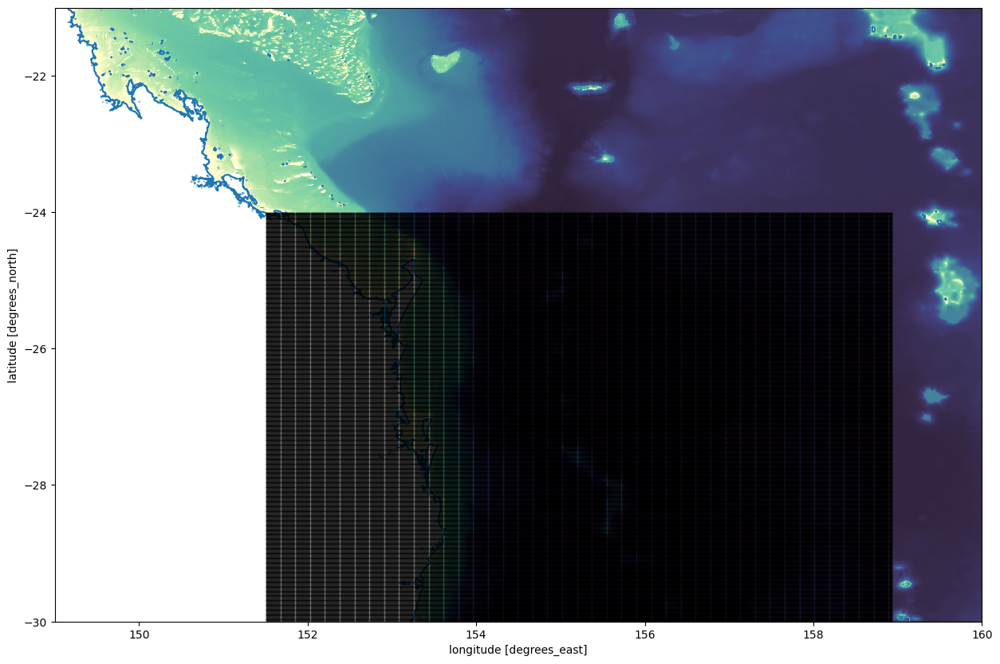

In [19]:
import matplotlib.colors as colors
fig=plt.figure(figsize=(15,10))
im = (-g23.elevation).plot.pcolormesh(x='lon',y='lat',cmap='cmo.deep',add_colorbar=False,norm=colors.LogNorm(10, 5000))
co=plt.contour(g23.lon,g23.lat,g23.elevation,levels=np.array([0]),colors='C0')

plt.plot(x[1::2,1::2],y[1::2,1::2],'.',color='k',markersize=.5)


In [20]:
#Control on whether to continue with grid making
ShouldContinue=True
if ShouldContinue:
    print('Continuing..')
else:
    STOP

Continuing..


In [21]:

lat,lon = y,x

#calculate curvilinear coordinate distances at rho points
dx = haversine(lon[1::2,0:-2:2],lat[1::2,0:-2:2],lon[1::2,2::2],lat[1::2,2::2])
dy = haversine(lon[0:-2:2,1::2],lat[0:-2:2,1::2],lon[2::2,1::2],lat[2::2,1::2])


#calculate curvilinear coordinate metrices
pm = 1.0/dx
pn = 1.0/dy
 
dndx = np.empty_like(pm)
dmde = np.empty_like(pn)

dndx[:,1:-1] = 0.5*(pn[:,2:] - pn[:,:-2])
dmde[1:-1,:] = 0.5*(pm[2:,:] - pm[:-2,:])

dndx[:,0]  = 2*dndx[:,1]  - dndx[:,2]
dndx[:,-1] = 2*dndx[:,-2] - dndx[:,-3]
dmde[0,:]  = 2*dmde[1,:]  - dmde[2,:]
dmde[-1,:] = 2*dmde[-2,:] - dmde[-3,:]

#subset lat and lon at rho, psi, u and v points
lon_rho = lon[1::2,1::2]
lat_rho = lat[1::2,1::2]

lon_psi = lon[2:-1:2,2:-1:2]
lat_psi = lat[2:-1:2,2:-1:2]

lon_u = lon[1::2,2:-1:2]
lat_u = lat[1::2,2:-1:2]

lon_v = lon[2:-1:2,1::2]
lat_v = lat[2:-1:2,1::2]

## Begin interpolation from raw data to constructed grid

In [22]:
# interpolate the raw data field bathy, mask_ocean to the new lon_rho, lat_rho

geom = g23

In [23]:
# raw data coordinates
lat_s = geom.latitude.values.flatten()
lon_s = geom.longitude.values.flatten()

In [24]:
# interpolate from the geometry grid to the new roms grid

from scipy.interpolate import griddata

def grid_data(data):
    return griddata((lon_s,lat_s),data,(lon_rho,lat_rho),'nearest')

roms_tmp = {}
for key in ['bathy','mask_ocean']:
    roms_tmp[key] = grid_data(geom[key].values.flatten())
    print('interpolated',key)

interpolated bathy
interpolated mask_ocean


<Figure size 640x480 with 0 Axes>

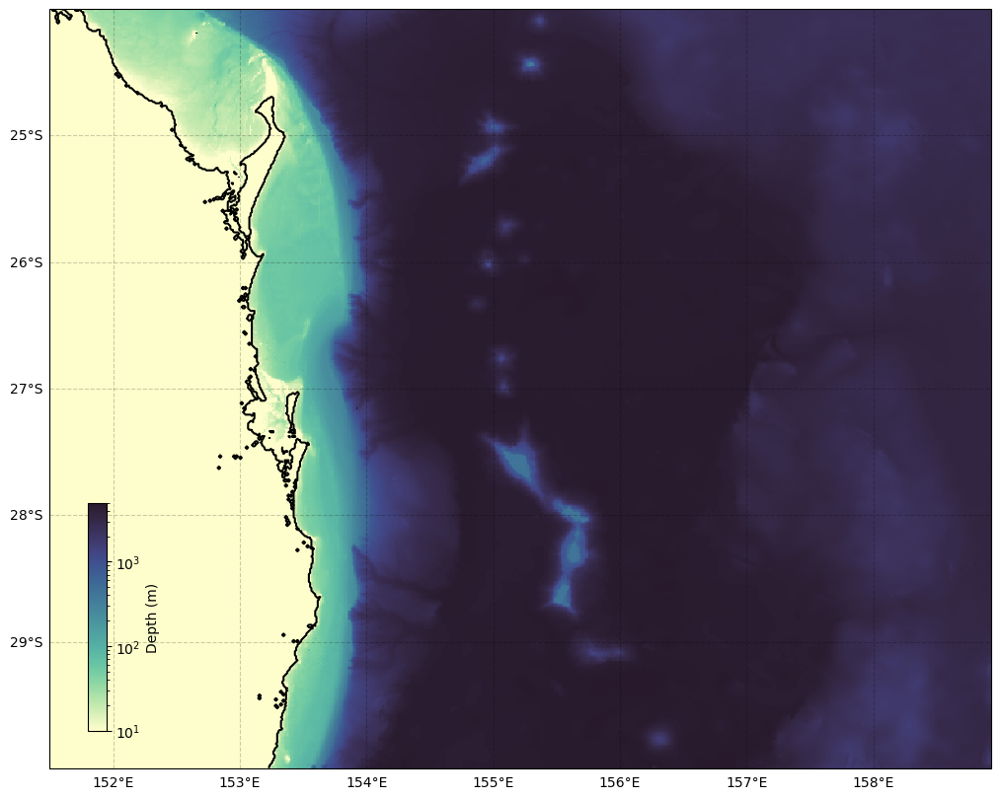

In [25]:
# Create a plot of the interpolated first-cut model bathymetry data using Cartopy

gs = gridspec.GridSpec(nrows=1,ncols=1,wspace=0.05, hspace=0.05)
plt.cla()
plt.clf()
fig = plt.figure(figsize=[15,10])
ax = None

#make an axis and decorate the cartopy stuff
ax = fig.add_subplot(gs[0,0], projection=ccrs.PlateCarree())
gl = ax.gridlines(draw_labels=True,color='black', alpha=0.2, linestyle='--')
gl.right_labels = False
gl.top_labels = False
# ax.set_extent([64, 80, -75, -62])

#add data
im = plt.pcolormesh(lon_rho,lat_rho,roms_tmp['bathy'],cmap='cmo.deep',norm=colors.LogNorm(10, 5000))
co = plt.contour(lon_rho,lat_rho,roms_tmp['bathy'],levels=np.array([0.1]),colors='k')

#add colourbar
cax = inset_axes(ax,
                width="2%",  # width = 10% of parent_bbox width
                height="30%",  # height : 50%
                loc='lower left',
                bbox_to_anchor=(.04,.05, 1, 1),
                bbox_transform=ax.transAxes,
                borderpad=0,
                )
cbar = fig.colorbar(im, cax=cax) 
cbar.set_label('Depth (m)')
ax = plt.gca()

plt.show()


dx min/max/mean (m):  1964.0 1973.0 1968.0
dy min/max/mean (m):  2224.0 2224.0 2224.0


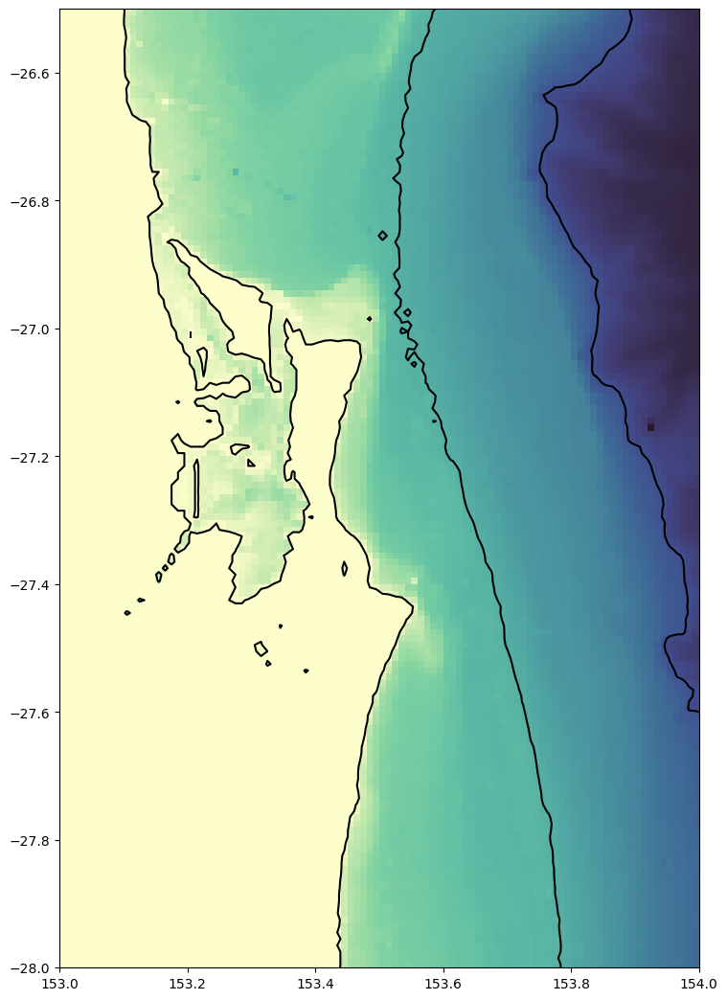

In [26]:
# plot of chosen subset
fig,ax=plt.subplots(figsize=(20,13))
im = plt.pcolormesh(lon_rho,lat_rho,roms_tmp['bathy'],cmap='cmo.deep',norm=colors.LogNorm(10, 5000))
co = plt.contour(lon_rho,lat_rho,roms_tmp['bathy'],colors='k',levels=np.array([0,10,100,1000]))
ax.set_aspect('equal','box')
ax.axis([153,154, -28,-26.5])

_sel = (lon_rho>153)&(lon_rho<154)&(lat_rho>-28)&(lat_rho<-27.5)
_sel = _sel*1.0
_sel[_sel==False]=np.NaN

sublon = lon_rho*_sel
sublat = lat_rho*_sel

dxx = haversine(sublon[1::2,0:-2:2],sublat[1::2,0:-2:2],sublon[1::2,2::2],sublat[1::2,2::2])
dyy = haversine(sublon[0:-2:2,1::2],sublat[0:-2:2,1::2],sublon[2::2,1::2],sublat[2::2,1::2])


print('dx min/max/mean (m): ',np.nanmin(dxx).round(),np.nanmax(dxx).round(),np.nanmean(dxx).round())
print('dy min/max/mean (m): ',np.nanmin(dyy).round(),np.nanmax(dyy).round(),np.nanmean(dyy).round())

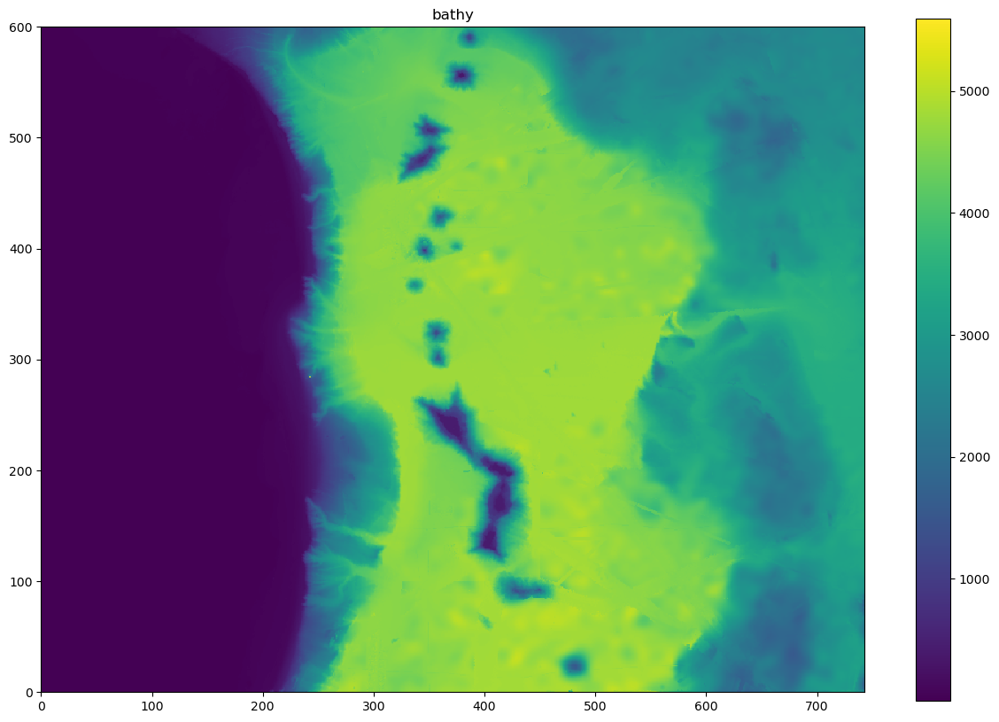

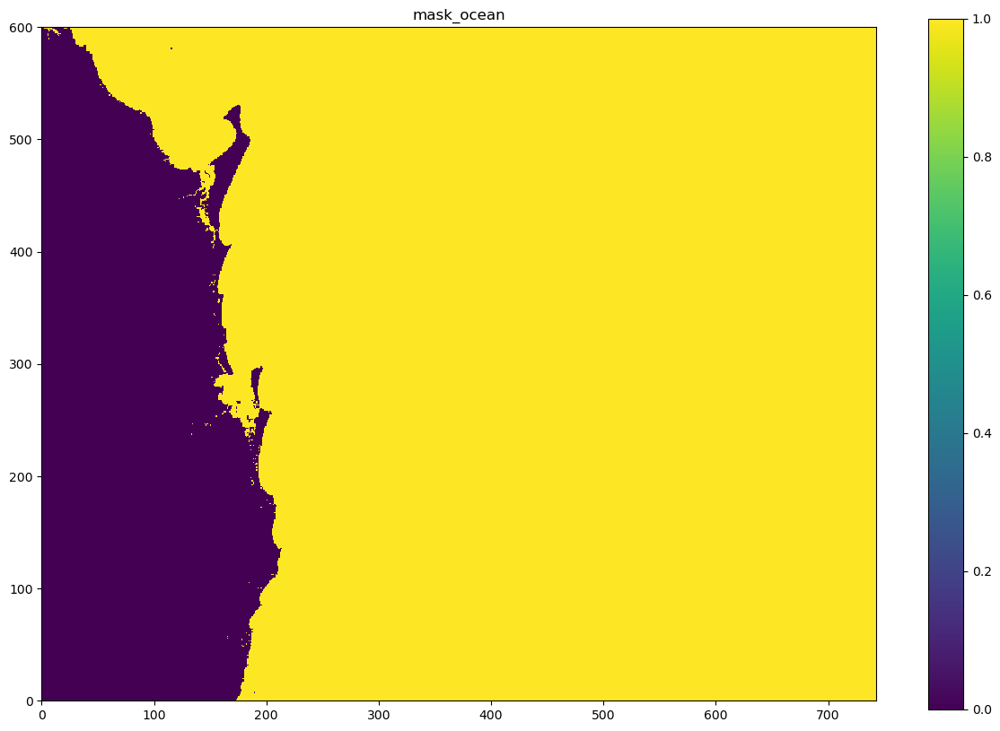

In [27]:
plotting=True

if plotting:
    plt.close()
    for key,data in roms_tmp.items():
        fig,ax = plt.subplots(figsize=(15,10))
        if key=='draft':
            plot = ax.pcolormesh(data)        
        else:
            plot = ax.pcolormesh(data)
        ax.set_title(key)
        plt.colorbar(plot,ax=ax)
        ax.set_aspect('equal')
        plt.show()

  
Minimum r-value =  0.0
Maximum r-value =  0.9166666666666666
Mean    r-value =  0.013823740617399114
Median  r-value =  0.0021238186285503793


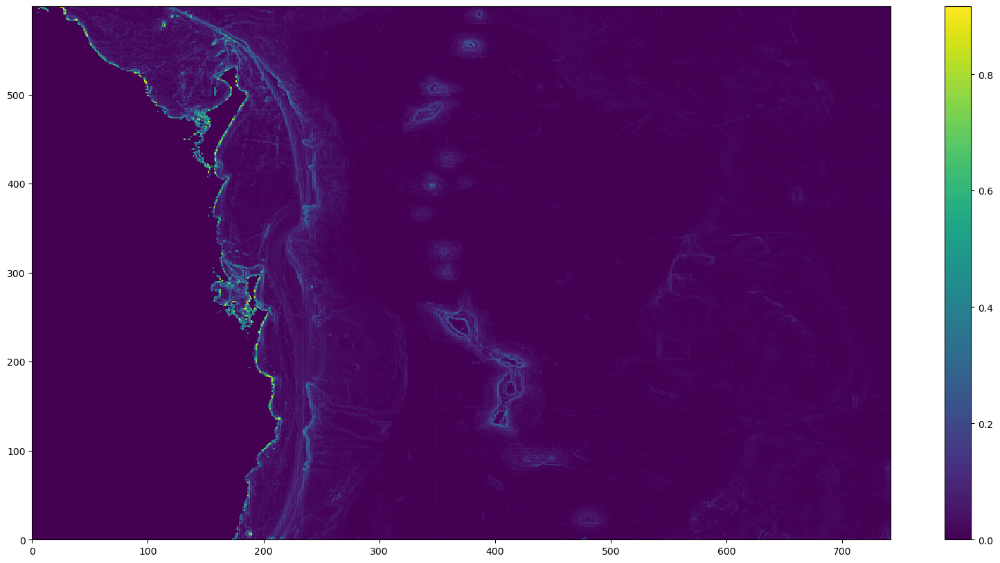

  
Minimum r-value =  0.0
Maximum r-value =  192.55569623643672
Mean    r-value =  3.0787577616693538
Median  r-value =  0.7050456821867132


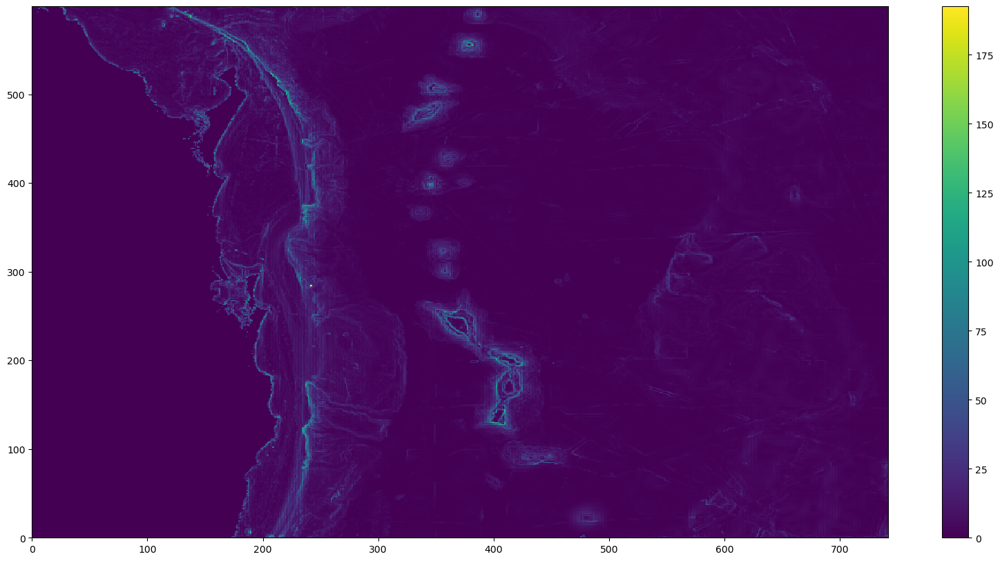

In [28]:


z_rho_pre,z_w_pre,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,roms_tmp['bathy'],np.zeros(roms_tmp['bathy'].shape))


fig = plt.figure(figsize=(20,10))
grd_rx0_pre=GridStiffness.rx0(roms_tmp['bathy'],roms_tmp['mask_ocean'])
plt.pcolormesh(grd_rx0_pre)
plt.colorbar()
plt.show()
fig = plt.figure(figsize=(20,10))
grd_rx1_pre=GridStiffness.rx1(z_w_pre,roms_tmp['mask_ocean'])
plt.pcolormesh(grd_rx1_pre)
plt.colorbar()
plt.show()

In [29]:
# do checks
print('min/max h is',roms_tmp['bathy'].min(),'/',roms_tmp['bathy'].max())


min/max h is 0.1 / 5597.0


In [30]:
print('rx0/rx1 values were:')

z_rho_pre,z_w_pre,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,roms_tmp['bathy'],np.zeros(roms_tmp['bathy'].shape))
grd_rx0_pre=GridStiffness.rx0(roms_tmp['bathy'],roms_tmp['mask_ocean'])
grd_rx1_pre=GridStiffness.rx1(z_w_pre,roms_tmp['mask_ocean'])

print('First round of smoothing')

bed = roms_tmp['bathy']
bed_raw = roms_tmp['bathy']

mask = roms_tmp['mask_ocean']
maskNaN = mask.copy() # make a nan mask.
maskNaN = np.where(maskNaN==0,np.NaN,maskNaN)

print('deepen ice until it is at least min_depth')
# first, make any bedrock above MSL (remove mountains)
min_depth0=0.1
bed[bed < min_depth0] = min_depth0 #note that bathy cannot >=0

# reduce/cap the max bathy to increase CFL speed
max_depth=4000
bed[bed>max_depth]=max_depth



print('begin smoothing')
# smooth the wct and bed, then deepen the ice to correct for smoothed wct/bed.
rx0in = 0.1
max_iter = 50

Area = 1/(pm*pn)

print('now, smooth bed')
bed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(np.ones_like(bed),bed,rx0in,Area,max_iter)
print('post-smoothing rx0/rx1 values were:')

z_rho_post,z_w_post,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,bed,np.zeros(bed.shape))
grd_rx0_post=GridStiffness.rx0(bed,mask)
grd_rx1_post=GridStiffness.rx1(z_w_post,mask)


rx0/rx1 values were:
  
Minimum r-value =  0.0
Maximum r-value =  0.9166666666666666
Mean    r-value =  0.013823740617399114
Median  r-value =  0.0021238186285503793
  
Minimum r-value =  0.0
Maximum r-value =  192.55569623643672
Mean    r-value =  3.0787577616693538
Median  r-value =  0.7050456821867132
First round of smoothing
deepen ice until it is at least min_depth
begin smoothing
now, smooth bed
Old Max Roughness value is:  0.996007984031936


DeltaBathymetry =  -0.25
New Max Roughness value is:  0.15607343663594012
post-smoothing rx0/rx1 values were:
  
Minimum r-value =  0.0
Maximum r-value =  0.13595618189551786
Mean    r-value =  0.010028238091558847
Median  r-value =  0.0
  
Minimum r-value =  0.0
Maximum r-value =  33.180549517769066
Mean    r-value =  2.3911104808249704
Median  r-value =  0.0


In [31]:
# do checks
print('min/max h is',np.nanmin((bed*maskNaN)),'/',np.nanmax((bed*maskNaN)))


min/max h is 0.18686282353611378 / 4000.0


In [32]:
# now apply the actual minimum water column thickness
min_depth=10.0

bed_smooth1 = bed.copy()

bed[bed < min_depth] = min_depth


In [33]:
# do checks

print('min/max h is',np.nanmin((bed*maskNaN)),'/',np.nanmax((bed*maskNaN)))


min/max h is 10.0 / 4000.0


  
Minimum r-value =  0.0
Maximum r-value =  0.11139922977737714
Mean    r-value =  0.009362102229969414
Median  r-value =  0.0


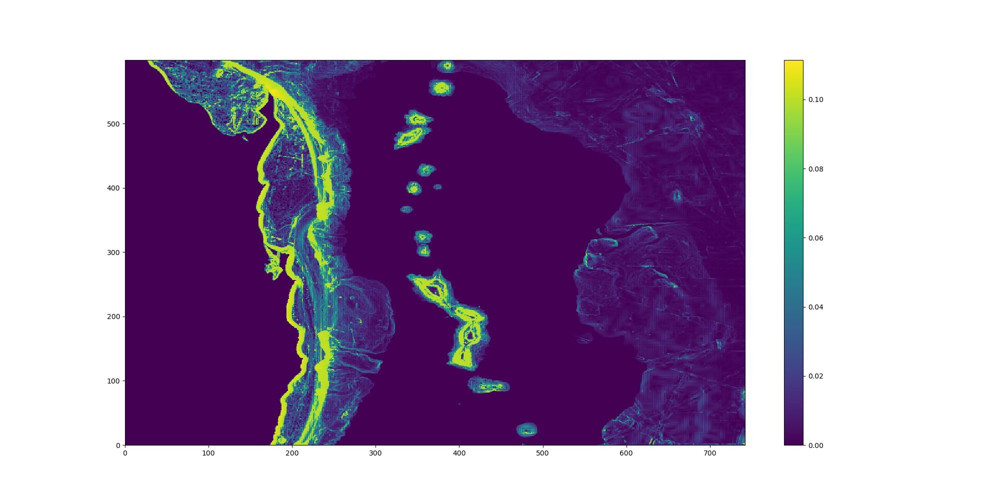

  
Minimum r-value =  0.0
Maximum r-value =  33.180549517769066
Mean    r-value =  2.3415713884191653
Median  r-value =  0.0


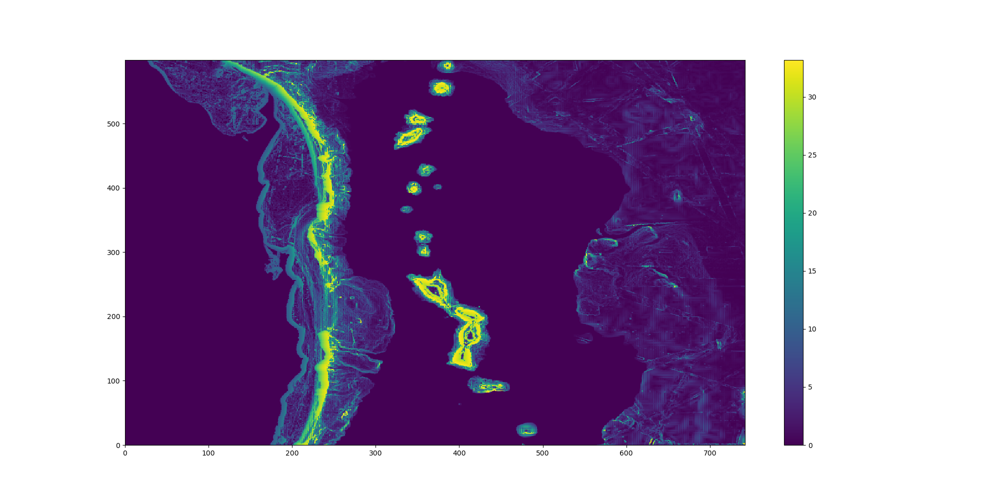

In [43]:


z_rho_mid,z_w_mid,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,bed,np.zeros(roms_tmp['bathy'].shape))

fig = plt.figure(figsize=(20,10))
grd_rx0_mid=GridStiffness.rx0(bed,mask)
plt.pcolormesh(grd_rx0_mid)
plt.colorbar()
plt.show()
fig = plt.figure(figsize=(20,10))
grd_rx1_mid=GridStiffness.rx1(z_w_mid,mask)
plt.pcolormesh(grd_rx1_mid)
plt.colorbar()
plt.show()


In [35]:


# now re-check that min_depth is obeyed for all ocean points
ii = ((bed) < min_depth) & (mask == 1)
bed[ii] = min_depth

# do the same for all non-ocean points
ii = ((bed) < min_depth) & (mask == 0)
bed[ii] = min_depth # for those locations, the depth needs to be min_depth above the bathy


  
Minimum r-value =  0.0
Maximum r-value =  0.11139922977737714
Mean    r-value =  0.009362102229969414
Median  r-value =  0.0


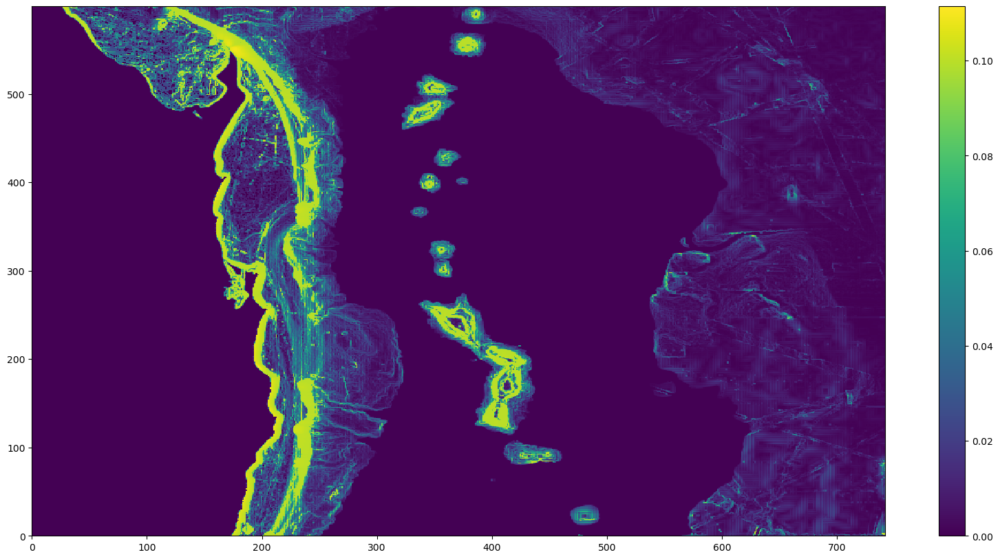

  
Minimum r-value =  0.0
Maximum r-value =  33.180549517769066
Mean    r-value =  2.3415713884191653
Median  r-value =  0.0


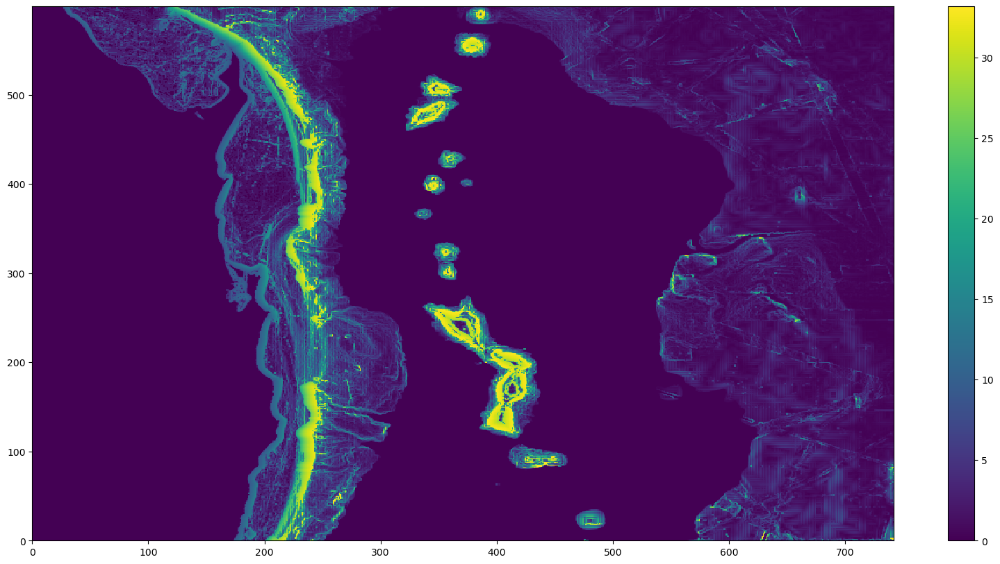

In [36]:

z_rho_mid,z_w_mid,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,bed,np.zeros(roms_tmp['bathy'].shape))

fig = plt.figure(figsize=(20,10))
grd_rx0_mid=GridStiffness.rx0(bed,mask)
plt.pcolormesh(grd_rx0_mid)
plt.colorbar()
plt.show()
fig = plt.figure(figsize=(20,10))
grd_rx1_mid=GridStiffness.rx1(z_w_mid,mask)
plt.pcolormesh(grd_rx1_mid)
plt.colorbar()
plt.show()


In [37]:
# update values in roms_tmp

roms_tmp['bed'] = bed
roms_tmp['mask'] = mask

bathy


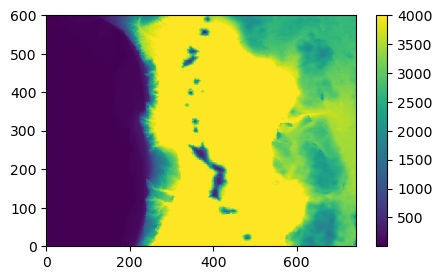

mask_ocean


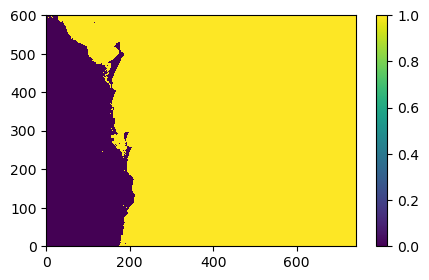

bed


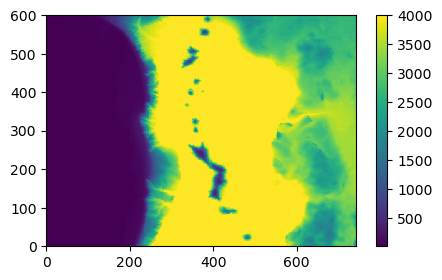

mask


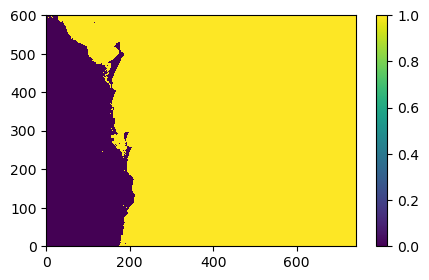

In [38]:
if plotting:
    plt.close()
    for k,v in roms_tmp.items():
        plt.figure(figsize=(5,3))
        print(k)
        plt.pcolormesh(v)
        plt.colorbar()
        plt.show()

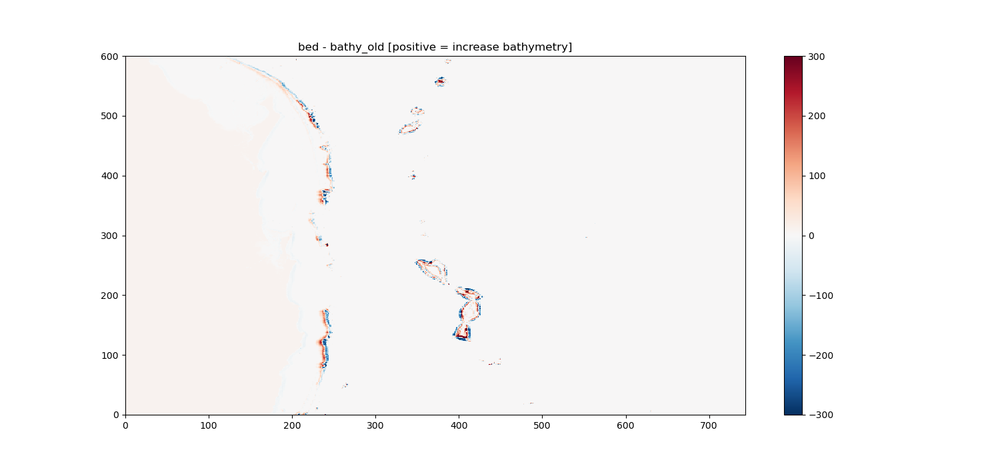

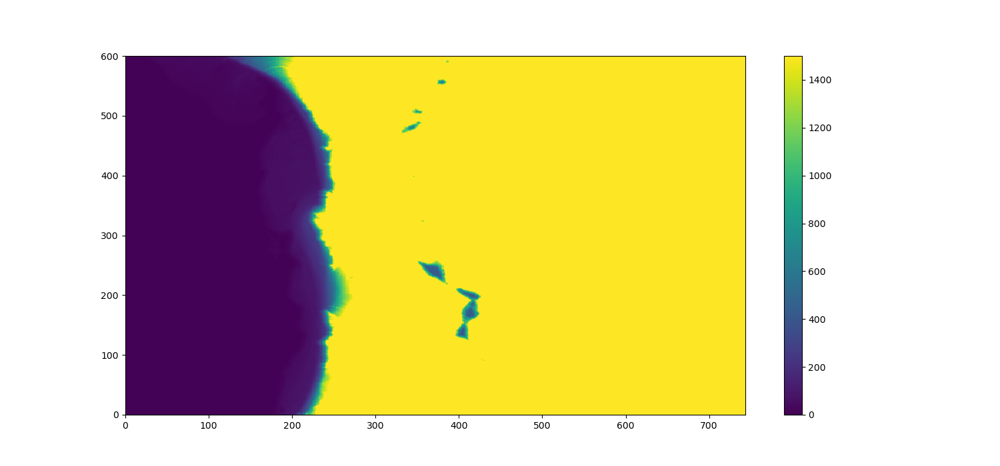

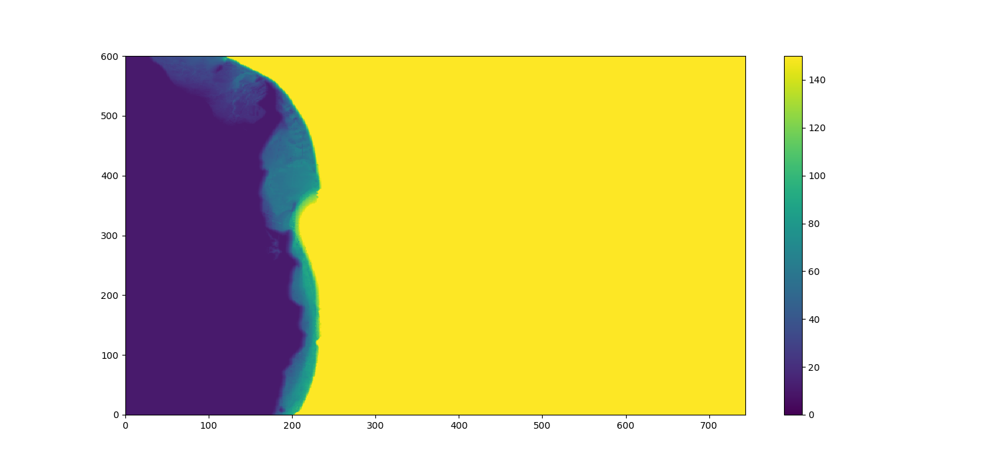

In [41]:
%matplotlib widget
plt.close('all')
plt.figure(figsize=(15,7))
plt.pcolormesh(bed-roms_tmp['bathy'],vmin=-300,vmax=300,cmap='RdBu_r')
plt.title('bed - bathy_old [positive = increase bathymetry]')
plt.colorbar()
plt.figure(figsize=(15,7))
plt.pcolormesh(bed,vmin=0,vmax=1500)
plt.colorbar()
plt.figure(figsize=(15,7))
plt.pcolormesh(bed,vmin=0,vmax=150)
plt.colorbar()

In [ ]:
mask = mask.astype(float)
mindxy = min(np.hstack((1/pm.flatten(),1/pn.flatten())))
maskNaN = mask.copy()
maskNaN[mask==0]=np.nan
CFL = mindxy/abs(np.sqrt(9.81*bed))*maskNaN

print('minimum dx/dy (m): ',mindxy)
print('max fast DT in s following CFL: ', np.nanmin(CFL))
print('max slow DT in s following CFL: ', np.nanmin(mindxy/8*maskNaN)) # approx max 8m/s baroclinic wave speed
print('Set ROMS timestep settings of at least: \n','DT <',np.nanmin(mindxy/8*maskNaN),'s \n NDTFAST >',(np.nanmin(mindxy/8*maskNaN)/np.nanmin(CFL)).round())
timescale = 12*60*60 #s
print('approximate viscosity settings for smoothing timescale of ',timescale/(60*60),' hrs')
print('visc2 for 2dx noise ~ ',(2*mindxy/(2*np.pi))**2 / timescale)
print('approximate diff settings are an order of magnitude lower:')
print('tnu2 ~ ',((2*mindxy/(2*np.pi))**2 / timescale/10))

minimum dx/dy (m):  963.0248264260879
max fast DT in s following CFL:  4.861530154304082
max slow DT in s following CFL:  120.37810330326099
Set ROMS timestep settings of at least: 
 DT < 120.37810330326099 s 
 NDTFAST > 25.0
approximate viscosity settings for smoothing timescale of  12.0  hrs
visc2 for 2dx noise ~  2.1751613323759584
approximate diff settings are an order of magnitude lower:
tnu2 ~  0.21751613323759583


In [ ]:
# do checks
print('whole domain')
print('min/max h is',bed.min(),'/',bed.max())
print('ocean cells')
print('min/max h is',np.nanmin(bed*maskNaN),'/',np.nanmax(bed*maskNaN))


whole domain
min/max h is 10.0 / 4000.0
ocean cells
min/max h is 10.0 / 4000.0


  
Minimum r-value =  0.0
Maximum r-value =  0.1053700028168689
Mean    r-value =  0.009762131452605752
Median  r-value =  0.0


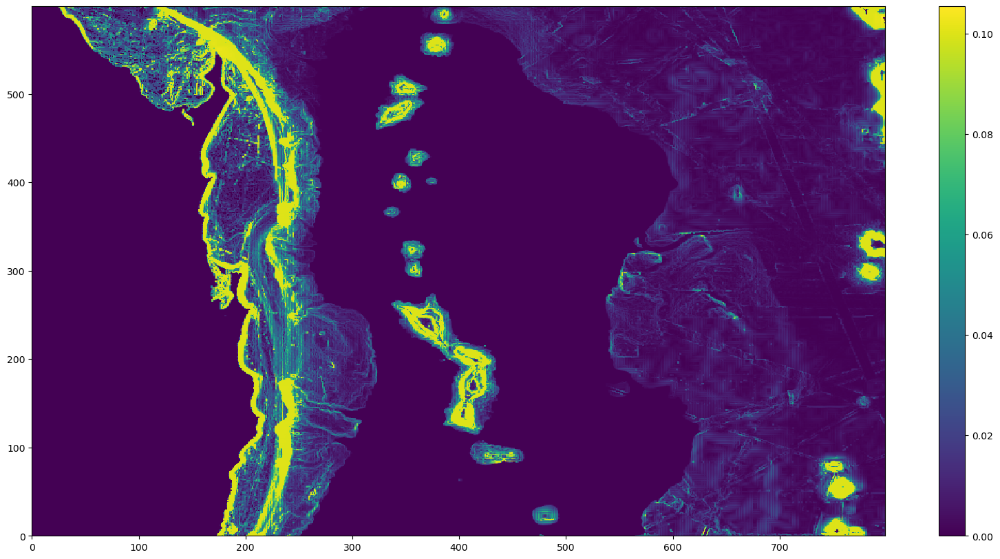

  
Minimum r-value =  0.0
Maximum r-value =  33.180549517769066
Mean    r-value =  2.5047503759726615
Median  r-value =  0.0


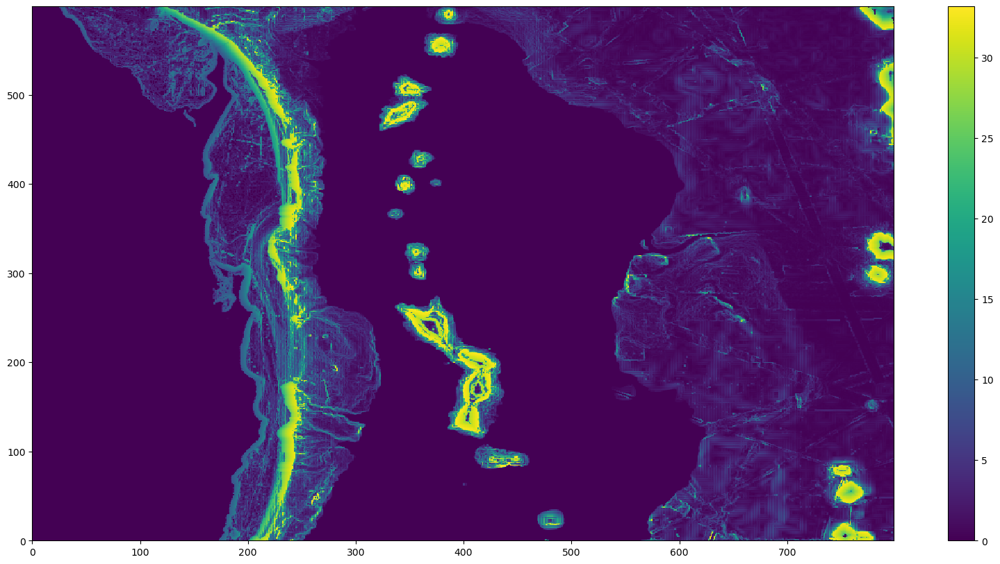

In [ ]:



z_rho_post,z_w_post,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,roms_tmp['bed'],np.zeros(roms_tmp['bed'].shape))

fig = plt.figure(figsize=(20,10))
grd_rx0_post=GridStiffness.rx0(roms_tmp['bed'],roms_tmp['mask'])
plt.pcolormesh(grd_rx0_post)
plt.colorbar()
plt.show()
fig = plt.figure(figsize=(20,10))
grd_rx1_post=GridStiffness.rx1(z_w_post,roms_tmp['mask'])
plt.pcolormesh(grd_rx1_post)
plt.colorbar()
plt.show()


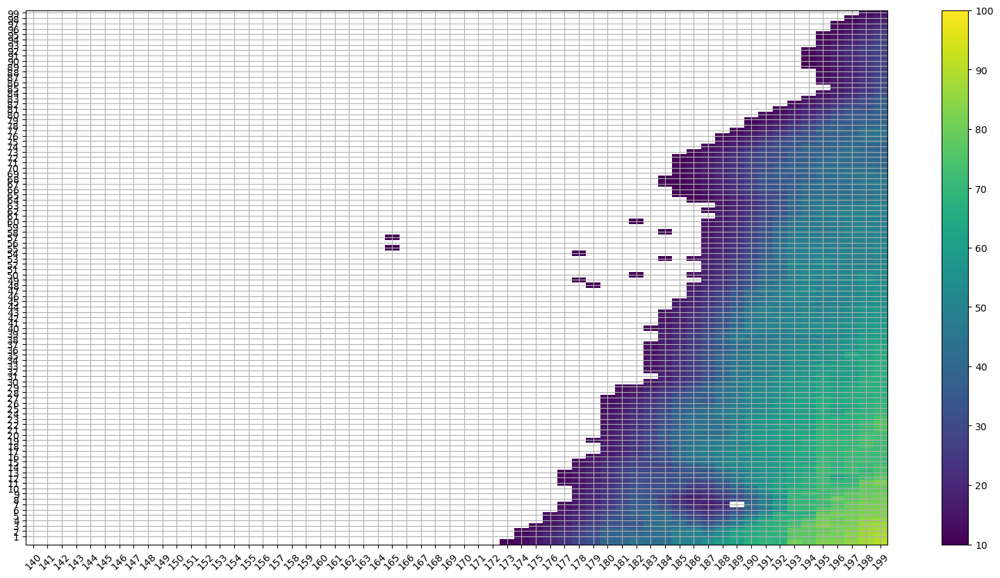

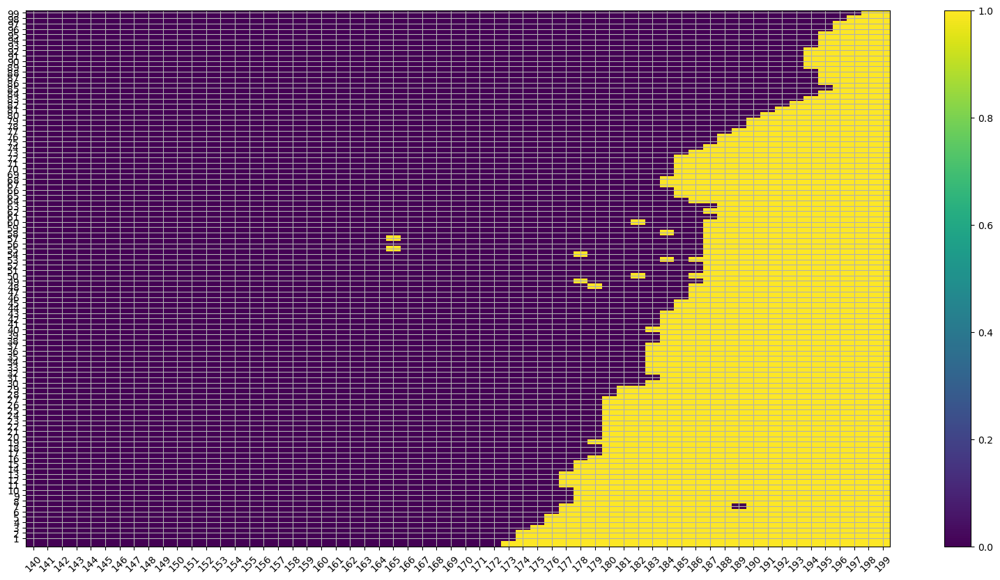

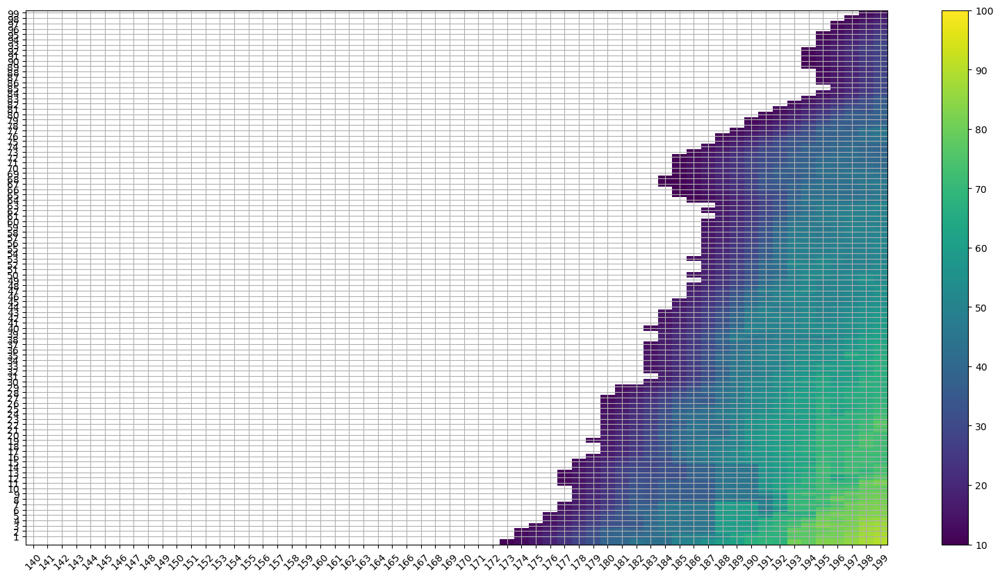

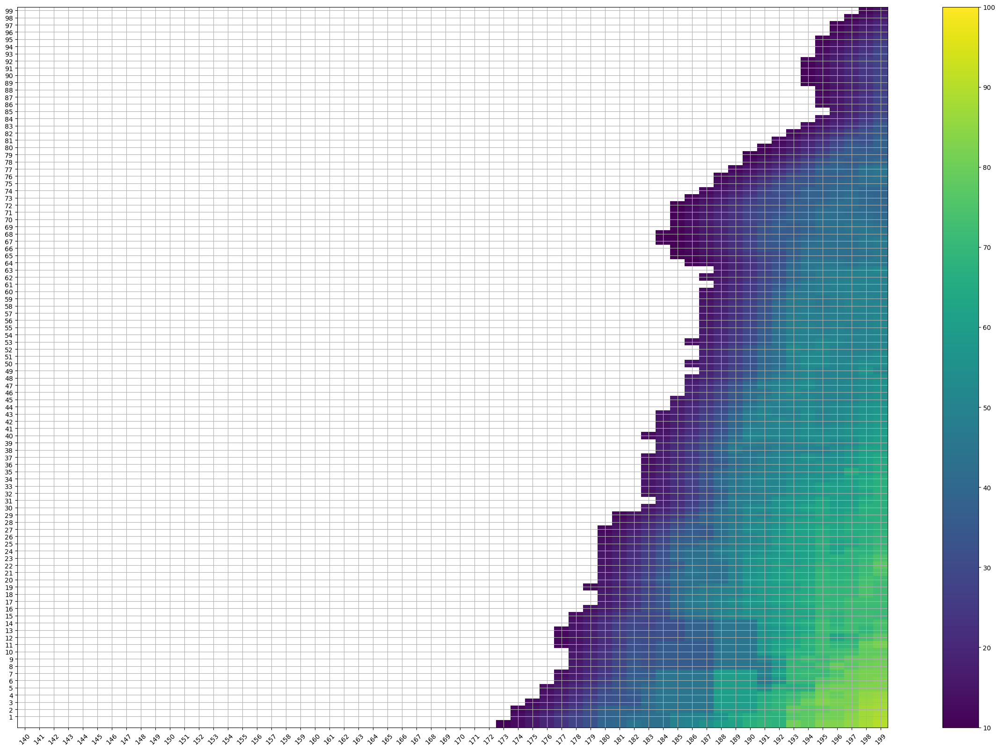

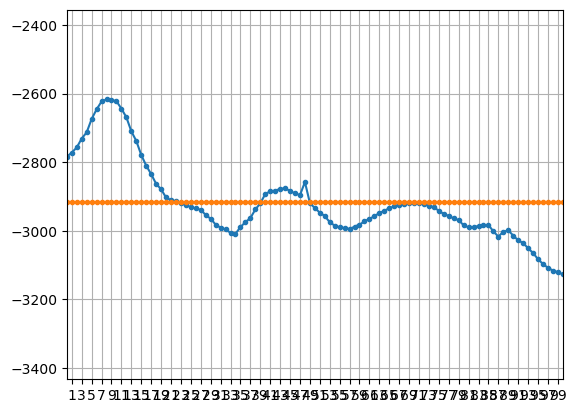

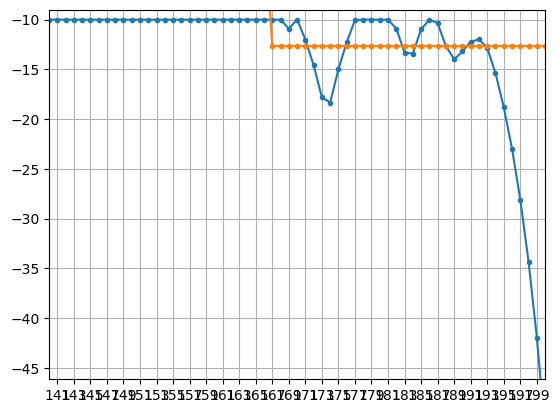

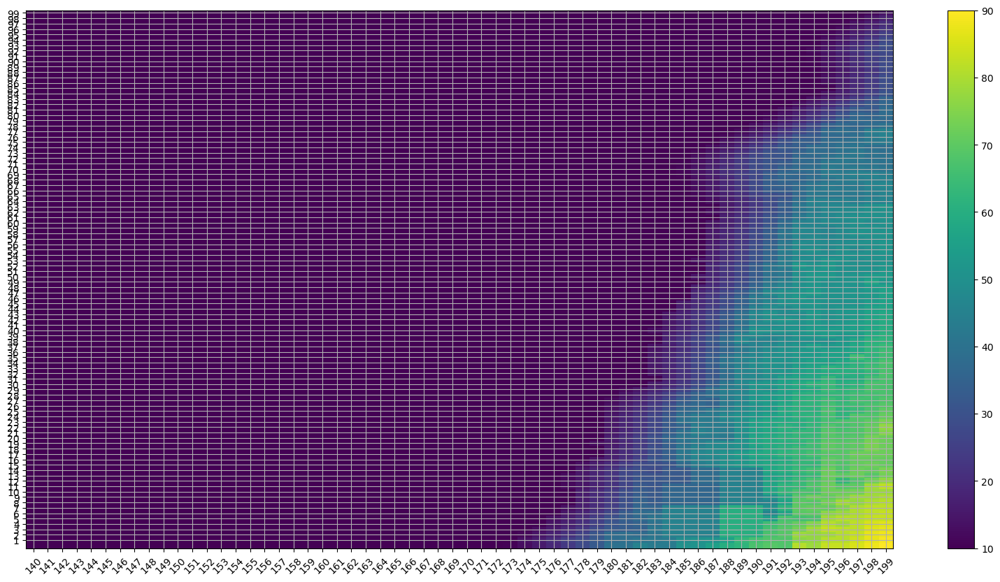

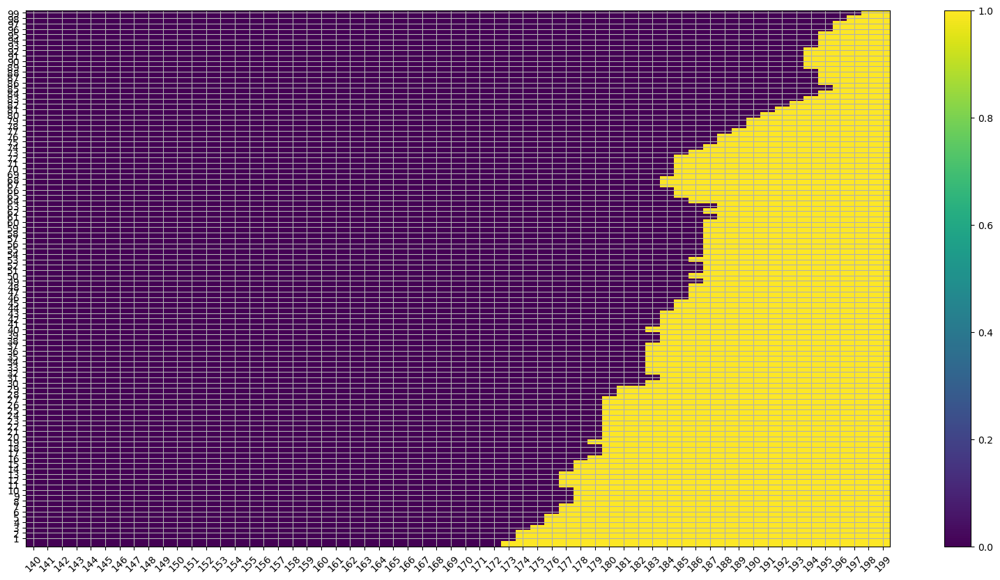

  
Minimum r-value =  0.0
Maximum r-value =  33.180549517769066
Mean    r-value =  2.503788245687707
Median  r-value =  0.0
(0,)


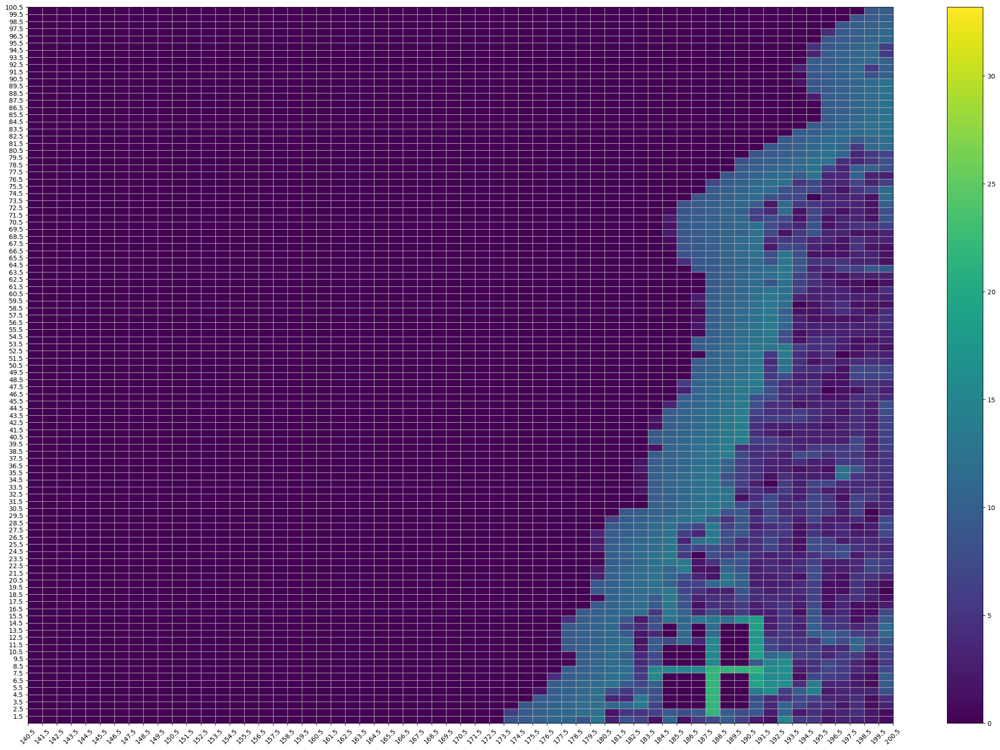

In [ ]:

def smoothBathyPatch(h_new,eta,xi):
    """
    function smoothBathyPatch(h_new,eta,xi)
    
    usage:
    h_new = smoothBathyPatch(h_new,eta,xi)
    
    

    """
        # define inpaint_nans
    from scipy.signal import convolve2d
    import numpy as np
    def inpaint_nans(inField):
        im = inField.copy()
        import scipy
        ipn_kernel = np.array([[1,1,1],[1,0,1],[1,1,1]]) # kernel for inpaint_nans
        nans = np.isnan(im)
        while np.sum(nans)>0:
            im[nans] = 0
            vNeighbors = convolve2d((nans==False),ipn_kernel,mode='same',boundary='symm')
            im2 = convolve2d(im,ipn_kernel,mode='same',boundary='symm')
            im2[vNeighbors>0] = im2[vNeighbors>0]/vNeighbors[vNeighbors>0]
            im2[vNeighbors==0] = np.nan
            im2[(nans==False)] = im[(nans==False)]
            im = im2
            nans = np.isnan(im)
        return im


    h_new[eta,xi] = np.NaN
    h_new = inpaint_nans(h_new)
    
    return h_new



handEditing=True
if handEditing:
    # !!! BEWARE, ALL YE WHO ENTER HERE, THE REALM OF HAND-EDITING GEOMETRY. HERE BE DRAGONS. !!!
    # ensure that GridAdjustments functions are already loaded.

    focusRange=(140,200,0,100)
    seeBigPicture=False
    searchForValrx1=60
    # fig = plt.figure(figsize=(20,10))
    # plt.pcolormesh(grd_rx1_post)
    # plt.colorbar()
    # plt.grid()
    # plt.yticks(np.arange(1.5,1000,1),np.arange(1,1000,1))
    # plt.xticks(np.arange(1.5,1000,1),np.arange(1,1000,1))
    # plt.xlim(focusRange[0],focusRange[1])
    # plt.ylim(focusRange[2],focusRange[3])
    # plt.show()

    fig = plt.figure(figsize=(20,10))
    plt.pcolormesh((roms_tmp['bed'])*maskNaN,vmax=100)
    plt.grid()
    plt.yticks(np.arange(1.5,1000,1),np.arange(1,1000,1))
    plt.xticks(np.arange(1.5,1000,1),np.arange(1,1000,1),rotation=45)
    # plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
    plt.colorbar()
    plt.xlim(focusRange[0],focusRange[1])
    plt.ylim(focusRange[2],focusRange[3])
    plt.show()


    fig = plt.figure(figsize=(20,10))
    plt.pcolormesh((roms_tmp['mask']))
    plt.grid()
    plt.yticks(np.arange(1.5,1000,1),np.arange(1,1000,1))
    plt.xticks(np.arange(1.5,1000,1),np.arange(1,1000,1),rotation=45)
    # plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
    plt.colorbar()
    plt.xlim(focusRange[0],focusRange[1])
    plt.ylim(focusRange[2],focusRange[3])
    plt.show()



    hhh=roms_tmp['bed'].copy()
    mmm=roms_tmp['mask'].copy()
    
    # correct a very deep 'hole' east of Moreton.
    # hhh=setBathy(hhh,h_alter=1000,eta=slice(283,286),xi=slice(241,244))
    hhh=smoothBathyPatch(hhh,eta=slice(283,286),xi=slice(241,244))

    # remove isolated cells in Brisbane river valley
    mmm=adjustMask(mmm,0,eta=237,xi=133)
    mmm=adjustMask(mmm,0,eta=246,xi=134)
    mmm=adjustMask(mmm,0,eta=246,xi=145)
    mmm=adjustMask(mmm,0,eta=slice(240,260),xi=slice(143,165))
    
    # fix brisbane river mouth
    mmm=adjustMask(mmm,0,eta=slice(260,262),xi=165)

    #remove isolated cells in pine river valley
    mmm=adjustMask(mmm,0,eta=slice(283,290),xi=slice(150,154))

    # fix moreton island
    mmm=adjustMask(mmm,1,eta=slice(260,263),xi=slice(188,194))
    hhh=setBathy(hhh,h_alter=10,eta=slice(260,263),xi=slice(188,194))
    mmm=adjustMask(mmm,1,eta=slice(264,268),xi=slice(191,194))
    hhh=setBathy(hhh,h_alter=10,eta=slice(264,268),xi=slice(191,194))

    # fix southern moreton bay
    mmm=adjustMask(mmm,1,eta=slice(250,254),xi=183)
    hhh=setBathy(hhh,h_alter=10,eta=slice(250,254),xi=slice(188,194))
    mmm=adjustMask(mmm,1,eta=239,xi=185)
    mmm=adjustMask(mmm,1,eta=241,xi=188)
    hhh=setBathy(hhh,h_alter=10,eta=239,xi=185)
    hhh=setBathy(hhh,h_alter=10,eta=241,xi=188)
    mmm=adjustMask(mmm,0,eta=slice(235,243),xi=slice(179,192)) # remove bay south of peel, as it just overcools.
             
    # fix sth straddie 'lakes'
    mmm=adjustMask(mmm,0,eta=slice(204,234),xi=slice(183,192))
    mmm=adjustMask(mmm,0,eta=slice(222,228),xi=slice(193,195))
    mmm=adjustMask(mmm,0,eta=slice(234,236),xi=slice(184,186))
    mmm=adjustMask(mmm,0,eta=236,xi=185)

    # fix pumicestone passage
    mmm=adjustMask(mmm,1,eta=slice(291,293),xi=163)
    mmm=adjustMask(mmm,1,eta=297,xi=159)
    mmm=adjustMask(mmm,1,eta=299,xi=158)
    mmm=adjustMask(mmm,1,eta=slice(302,304),xi=156)
    hhh=setBathy(hhh,h_alter=10,eta=slice(291,293),xi=163)
    hhh=setBathy(hhh,h_alter=10,eta=297,xi=159)
    hhh=setBathy(hhh,h_alter=10,eta=299,xi=158)
    hhh=setBathy(hhh,h_alter=10,eta=slice(302,304),xi=156)
    mmm=adjustMask(mmm,0,eta=slice(307,318),xi=slice(156,160))
    mmm=adjustMask(mmm,0,eta=314,xi=161)
    mmm=adjustMask(mmm,0,eta=325,xi=162)
    mmm=adjustMask(mmm,0,eta=335,xi=157)
    mmm=adjustMask(mmm,0,xi=slice(155,165),eta=slice(292,308)) # remove pumicestone passage as it overcools
    
    # fix cooloola etc
    mmm=adjustMask(mmm,0,eta=slice(342,382),xi=slice(149,156))
    mmm=adjustMask(mmm,0,eta=slice(352,359),xi=slice(155,160))

    # fix fraser and fraser coast
    mmm=adjustMask(mmm,0,eta=slice(446,455),xi=slice(122,139))
    mmm=adjustMask(mmm,0,eta=slice(402,410),xi=slice(150,153))
    mmm=adjustMask(mmm,0,eta=slice(417,421),xi=slice(146,148))
    mmm=adjustMask(mmm,0,eta=slice(433,442),xi=slice(146,148))
    mmm=adjustMask(mmm,0,eta=slice(440,442),xi=slice(143,145))
    mmm=adjustMask(mmm,0,eta=440,xi=136)
    mmm=adjustMask(mmm,0,eta=426,xi=139)
    mmm=adjustMask(mmm,0,eta=450,xi=142)
    mmm=adjustMask(mmm,0,eta=slice(405,407),xi=153)
    mmm=adjustMask(mmm,0,eta=477,xi=114)
    mmm=adjustMask(mmm,0,eta=slice(480,482),xi=slice(108,111))
    mmm=adjustMask(mmm,0,eta=492,xi=103)

    # open inskip point channel and great sandy strait
    mmm=adjustMask(mmm,1,eta=417,xi=slice(155,157))
    hhh=setBathy(hhh,h_alter=10,eta=417,xi=slice(155,157))
    mmm=adjustMask(mmm,0,eta=419,xi=slice(155,157))
    mmm=adjustMask(mmm,1,eta=440,xi=141)
    hhh=setBathy(hhh,h_alter=10,eta=440,xi=141)
    
    # remove lakes south of byron and near byron
    mmm=adjustMask(mmm,0,eta=slice(46,63),xi=slice(164,185))
    mmm=adjustMask(mmm,0,eta=slice(112,113),xi=slice(204,207))
    mmm=adjustMask(mmm,0,eta=slice(100,107),xi=slice(184,196))
    
    # fix lakes near gold coast
    mmm=adjustMask(mmm,0,eta=slice(191,200),xi=slice(185,190))
    mmm=adjustMask(mmm,0,eta=slice(172,180),xi=slice(194,207))
    mmm=adjustMask(mmm,0,eta=slice(189,190),xi=slice(195,196))
    
    # fix river mouths bundy
    mmm=adjustMask(mmm,0,eta=504,xi=96)
    mmm=adjustMask(mmm,0,eta=523,xi=88)
    mmm=adjustMask(mmm,0,eta=533,xi=69)
    mmm=adjustMask(mmm,0,eta=539,xi=60)
    mmm=adjustMask(mmm,0,eta=slice(546,549),xi=slice(51,55))
    
    # crop any water at far north of domain
    mmm=adjustMask(mmm,0,eta=slice(588,600),xi=slice(0,23))
   
    # remove solitary isle, at about 188,5, which leads to blow up
    hhh=setBathy(hhh,h_alter=20,eta=7,xi=189)
    mmm=adjustMask(mmm,1,eta=7,xi=189)

    #actually, just flatten the whole area!
    hhh=setBathy(hhh,h_alter=45,eta=slice(2,8),xi=slice(184,188))
    hhh=setBathy(hhh,h_alter=60,eta=slice(2,8),xi=slice(188,191))
    hhh=setBathy(hhh,h_alter=45,eta=slice(8,15),xi=slice(188,191))
    #
    hhh=setBathy(hhh,h_alter=36,eta=slice(8,12),xi=slice(184,186))
    hhh=setBathy(hhh,h_alter=32,eta=slice(12,15),xi=slice(184,186))
    hhh=setBathy(hhh,h_alter=36,eta=slice(8,12),xi=slice(186,188))
    hhh=setBathy(hhh,h_alter=38,eta=slice(12,15),xi=slice(186,188))

    mmmNaN = mmm.copy().astype('float')
    mmmNaN[mmmNaN == 0] = np.NaN

    fig = plt.figure(figsize=(20,10))
    plt.pcolormesh(hhh*mmmNaN,vmax=100)
    plt.grid()
    plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
    plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
    # plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
    plt.colorbar()
    plt.xlim(focusRange[0],focusRange[1])
    plt.ylim(focusRange[2],focusRange[3])
    plt.show()
    
    
    fig = plt.figure(figsize=(30,20))
    plt.pcolormesh(hhh*mmmNaN,vmax=100)
    plt.grid()
    if seeBigPicture==False:
        plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
        plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
        plt.xlim(focusRange[0],focusRange[1])
        plt.ylim(focusRange[2],focusRange[3])
    else:
        plt.yticks(np.arange(1.5,600,25),np.arange(1,600,25))
        plt.xticks(np.arange(1.5,800,25),np.arange(1,800,25))
    plt.colorbar()
    plt.show()

    # look along a single xi value
    lookAt=789
    plt.plot(-hhh[:,lookAt],'.-')
    plt.plot(-1*mmm[:,lookAt]*np.mean(hhh[focusRange[2]:focusRange[3],lookAt]),'.-')
    plt.xticks(np.arange(1,1000,2),np.arange(1,1000,2))
    # plt.yticks(np.arange(-3500,0,200))
    plt.ylim((-(hhh[focusRange[2]:focusRange[3],lookAt]).max()*1.1,-(hhh[focusRange[2]:focusRange[3],lookAt]).min()*0.9))
    plt.xlim(focusRange[2],focusRange[3])
    plt.grid()
    plt.show()

    # look along a single eta value
    lookAt=299
    plt.plot(-hhh[lookAt,:],'.-')
    plt.plot(-1*mmm[lookAt,:]*np.mean(hhh[lookAt,focusRange[0]:focusRange[1]]),'.-')
    plt.xticks(np.arange(1,1000,2),np.arange(1,1000,2))
    # plt.yticks(np.arange(-3500,0,200))
    plt.ylim((-(hhh[lookAt,focusRange[0]:focusRange[1]]).max()*1.1,-(hhh[lookAt,focusRange[0]:focusRange[1]]).min()*0.9))
    plt.xlim(focusRange[0],focusRange[1])
    plt.grid()
    plt.show()
    
    fig = plt.figure(figsize=(20,10))
    plt.pcolormesh(hhh)
    plt.grid()
    plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
    plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
    # plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
    plt.colorbar()    
    plt.clim((hhh[focusRange[2]:focusRange[3],focusRange[0]:focusRange[1]].min(),hhh[focusRange[2]:focusRange[3],focusRange[0]:focusRange[1]].max()))
    plt.xlim(focusRange[0],focusRange[1])
    plt.ylim(focusRange[2],focusRange[3])
    plt.show()


    fig = plt.figure(figsize=(20,10))
    plt.pcolormesh(mmm)
    plt.grid()
    plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
    plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
    # plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
    plt.colorbar()
    plt.xlim(focusRange[0],focusRange[1])
    plt.ylim(focusRange[2],focusRange[3])
    plt.show()


    z_rho_test,z_w_test,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,hhh,np.zeros(roms_tmp['bed'].shape))
    grd_rx1_test=GridStiffness.rx1(z_w_test,mmm)
    max_vals_vals=grd_rx1_test[grd_rx1_test>searchForValrx1]
    max_vals_y,max_vals_x=np.nonzero(grd_rx1_test>searchForValrx1)
    print(max_vals_vals.shape)
    fig = plt.figure(figsize=(30,20))
    plt.pcolormesh(grd_rx1_test)
    plt.grid()
    plt.plot(max_vals_x,max_vals_y,'ro')

    if seeBigPicture==False:
        plt.yticks(np.arange(1,600,1),np.arange(1.5,600,1))
        plt.xticks(np.arange(1,800,1),np.arange(1.5,800,1),rotation=45)
        plt.xlim(focusRange[0],focusRange[1])
        plt.ylim(focusRange[2],focusRange[3])
    else:
        plt.yticks(np.arange(1,600,25),np.arange(1,600,25))
        plt.xticks(np.arange(1,800,25),np.arange(1,800,25))
        for x,y,t in zip(max_vals_x,max_vals_y,max_vals_vals):
            plt.text(x,y,str(x)+','+str(y)+','+str(round(t)),ha='left',fontsize=16)
    plt.colorbar()
    plt.show()


In [ ]:

import matplotlib.pyplot as plt
%matplotlib widget

z_rho_post,z_w_post,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,hhh,np.zeros(roms_tmp['bed'].shape))
grd_rx0_post=GridStiffness.rx0(hhh,mmm)
grd_rx1_post=GridStiffness.rx1(z_w_post,mmm)

plt.close('all')


fig,axs = plt.subplots(ncols=2,figsize=(15,8),sharex=True,sharey=True)
im=axs[0].pcolormesh(grd_rx0_post)
rx0_flat = grd_rx0_post.ravel()
ind = np.argpartition(rx0_flat,-10)[-10:]
ind
for where in ind: 
    w_j,w_i=np.unravel_index(where,grd_rx0_post.shape)
    axs[0].plot(w_i,w_j,'ro')
    axs[0].text(w_i,w_j,rx0_flat[where])
axs[0].set_yticks(np.arange(1.5,750.5,2),np.arange(1,750,2))
fig.colorbar(im,ax=axs[0])
axs[0].contour(mmm,levels=((0,1)),colors='C1')
im=axs[1].pcolormesh((hhh)*mmmNaN,vmax=150)
axs[1].set_yticks(np.arange(1.5,750.5,2),np.arange(1,750,2))
fig.colorbar(im,ax=axs[1])
axs[1].contour(mmm,levels=((0,1)),colors='C1')


fig,axs = plt.subplots(ncols=2,figsize=(15,8),sharex=True,sharey=True)
im=axs[0].pcolormesh(grd_rx1_post)
rx1_flat = grd_rx1_post.ravel()
ind = np.argpartition(rx1_flat,-10)[-10:]
ind
for where in ind: 
    w_j,w_i=np.unravel_index(where,grd_rx1_post.shape)
    axs[0].plot(w_i,w_j,'ro')
    axs[0].text(w_i,w_j,rx1_flat[where])
axs[0].set_yticks(np.arange(1.5,750.5,2),np.arange(1,750,2))
fig.colorbar(im,ax=axs[0])
axs[0].contour(mmm,levels=((0,1)),colors='C1')
im=axs[1].pcolormesh((hhh)*mmmNaN,vmax=150)
axs[1].set_yticks(np.arange(1.5,750.5,2),np.arange(1,750,2))
fig.colorbar(im,ax=axs[1])
axs[1].contour(mmm,levels=((0,1)),colors='C1')



# look along a single xi value
lookAtX=321
fig = plt.figure(figsize=(10,5))
plt.plot(-hhh[:,lookAtX],'.-')
plt.plot(-1*mmm[:,lookAtX]*2500,'.-')
plt.xticks(np.arange(1,1000,2),np.arange(1,1000,2))
plt.yticks(np.arange(-3500,0,200))
plt.title('xi ='+str(lookAtX))
# plt.xlim(focusRange[2],focusRange[3])
plt.grid()

# look along a single eta value
lookAtE=661
fig = plt.figure(figsize=(10,5))
plt.plot(-hhh[lookAtE,:],'.-')
plt.plot(-1*mmm[lookAtE,:]*2500,'.-')
plt.xticks(np.arange(1,1000,2),np.arange(1,1000,2))
plt.yticks(np.arange(-3500,0,200))
plt.title('eta ='+str(lookAtE))
plt.grid()


# from mpl_toolkits.mplot3d import axes3d
# fig = plt.figure(figsize=(10,5))
# ax = fig.add_subplot(projection='3d')
# # # Grab some test data.
# # X, Y, Z = axes3d.get_test_data(0.05)
# # Plot a basic wireframe.
# X,Y = np.meshgrid(np.arange(1,zzz.shape[1]+1),np.arange(1,zzz.shape[0]+1))
# ax.plot_wireframe(X[lookAtE-20:lookAtE+20,lookAtX-20:lookAtX+20],Y[lookAtE-20:lookAtE+20,lookAtX-20:lookAtX+20],hhh[lookAtE-20:lookAtE+20,lookAtX-20:lookAtX+20], rstride=1, cstride=1)
# ax.plot_wireframe(X[lookAtE-20:lookAtE+20,lookAtX-20:lookAtX+20],Y[lookAtE-20:lookAtE+20,lookAtX-20:lookAtX+20],zzz[lookAtE-20:lookAtE+20,lookAtX-20:lookAtX+20], rstride=1, cstride=1)
# ax.set_xlabel('xi')
# ax.set_ylabel('eta')



In [ ]:
STOP

(0.0, 40.0)

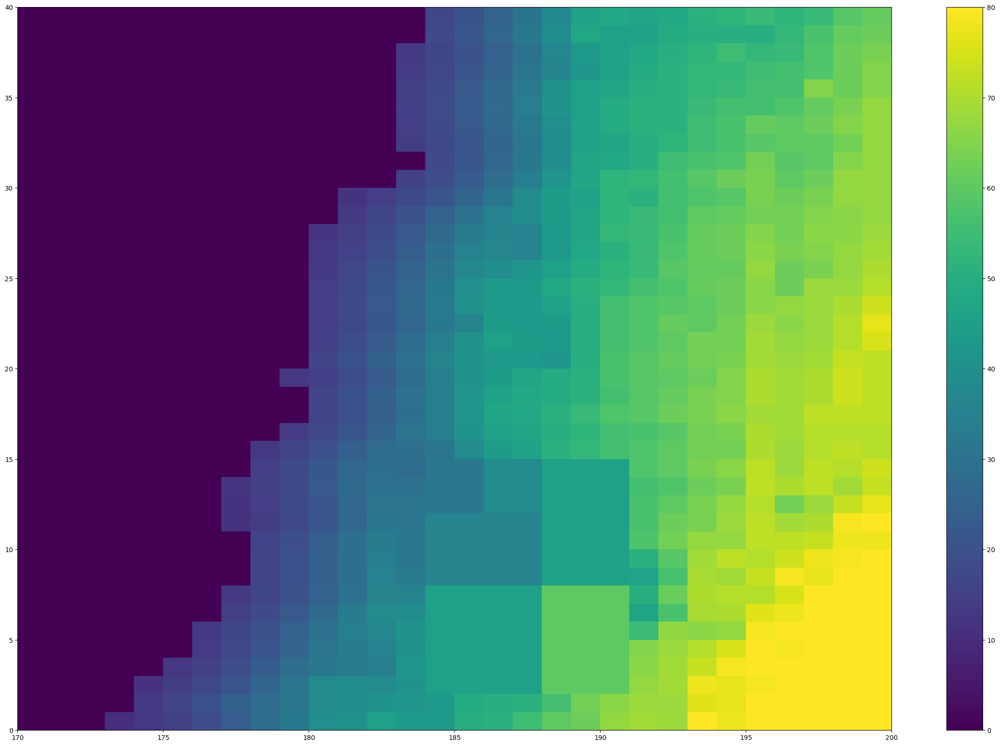

In [ ]:


fig = plt.figure(figsize=(30,20))
plt.pcolormesh(hhh*mmm,vmin=0,vmax=80)
plt.colorbar()
# max_vals_y,max_vals_x=np.nonzero(grd_rx1_final>50)
# max_vals_vals=grd_rx1_final[grd_rx1_final>50]
# plt.plot(max_vals_x,max_vals_y,'ro')
plt.xlim(170,200)
plt.ylim(0,40)
# print(max_vals_vals)



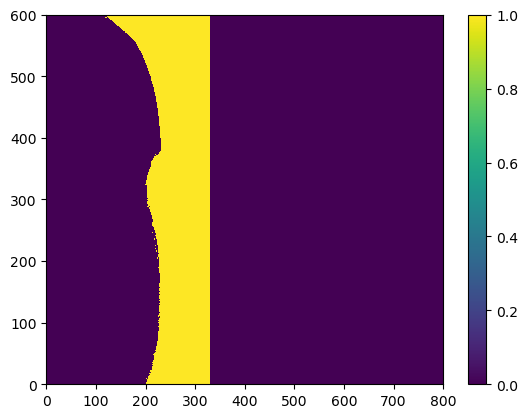

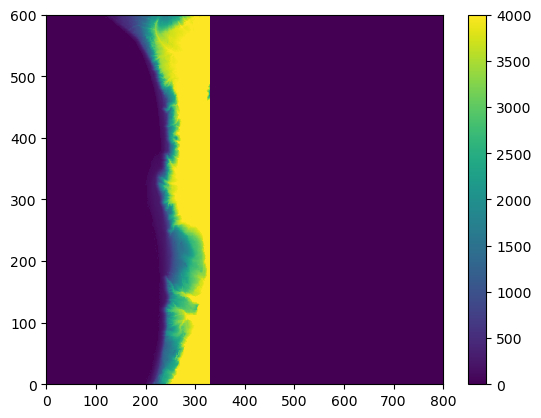

Old Max Roughness value is:  0.10105743468677089


DeltaBathymetry =  0.0625
New Max Roughness value is:  0.10000097708309716


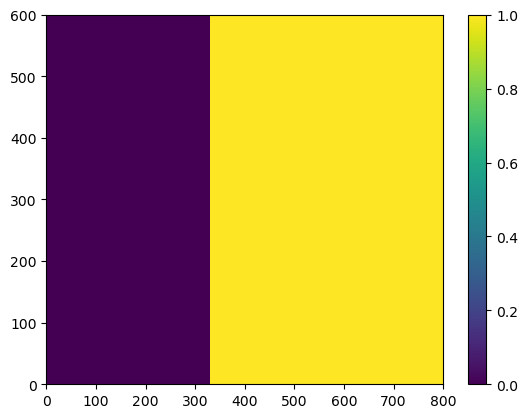

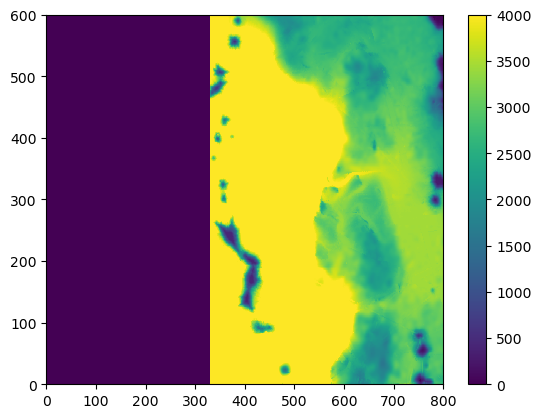

Old Max Roughness value is:  0.7098968623576801


DeltaBathymetry =  0.0
New Max Roughness value is:  0.10058958697284867


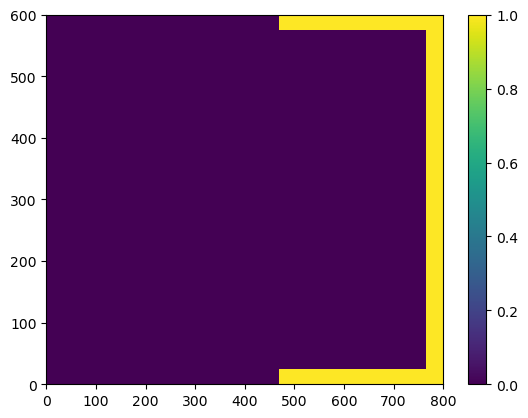

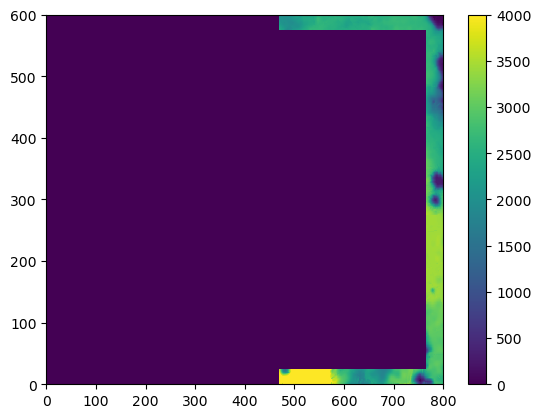

Old Max Roughness value is:  0.10058958697284867


DeltaBathymetry =  0.0
New Max Roughness value is:  0.060258603018926514


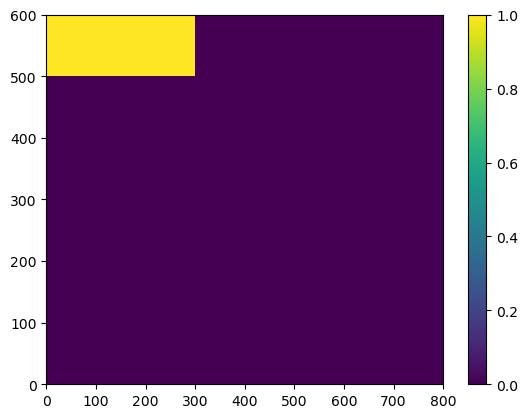

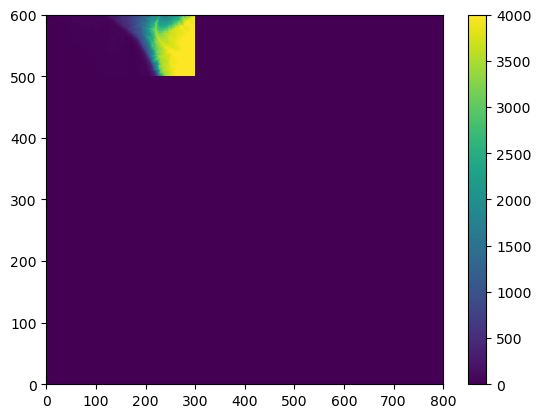

Old Max Roughness value is:  0.25581397361357294


DeltaBathymetry =  -0.0078125
New Max Roughness value is:  0.10007432881679192


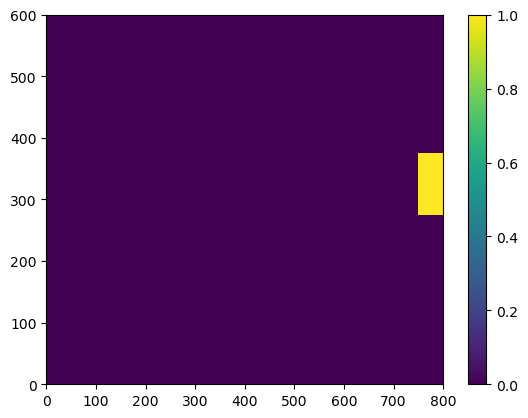

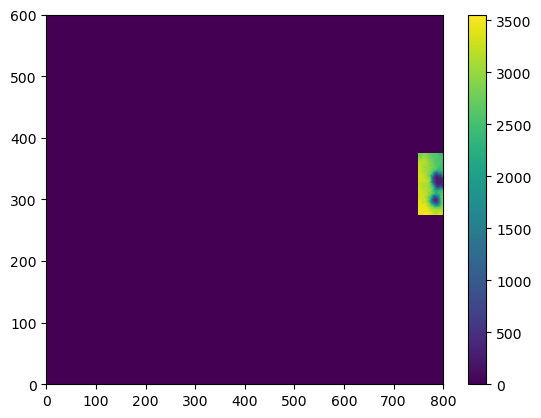

Old Max Roughness value is:  0.05194901920913169


DeltaBathymetry =  -0.001953125
New Max Roughness value is:  0.05015837430355955


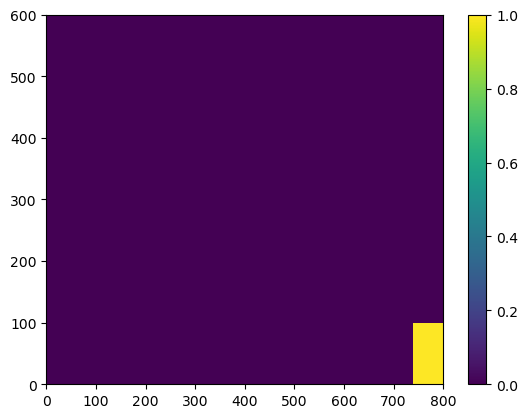

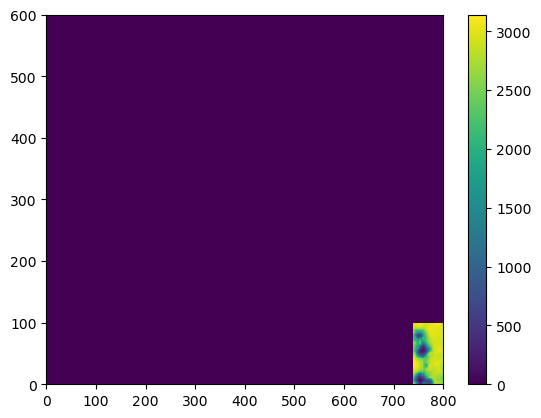

Old Max Roughness value is:  0.3219992923746427


DeltaBathymetry =  0.0
New Max Roughness value is:  0.10000006465379488


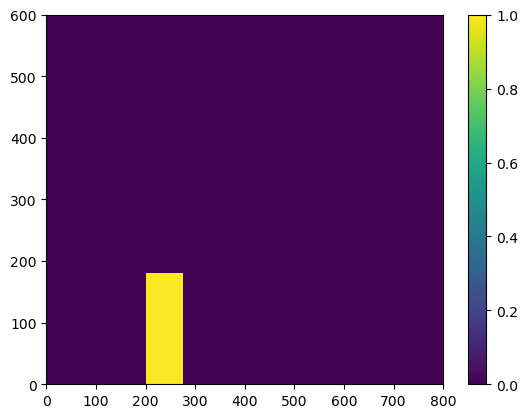

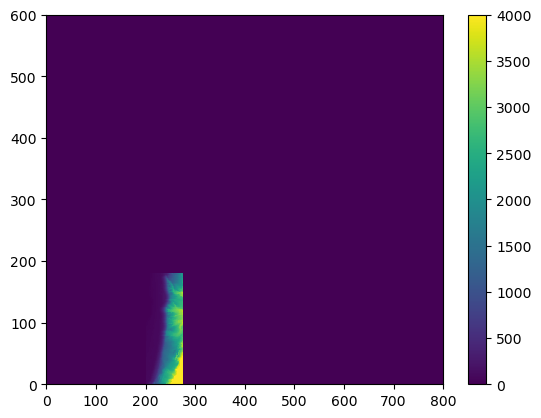

Old Max Roughness value is:  0.3895103834899877


DeltaBathymetry =  0.00390625
New Max Roughness value is:  0.1000000910871612


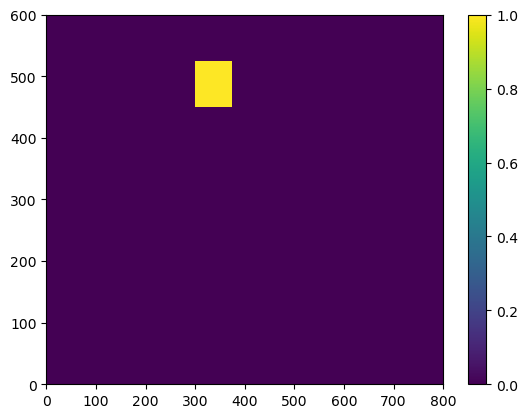

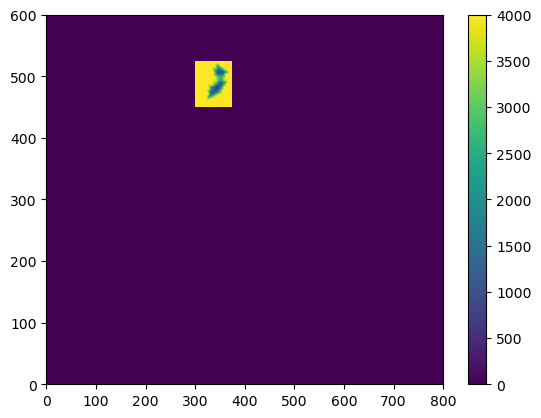

Old Max Roughness value is:  0.10000000067054354


DeltaBathymetry =  0.0
New Max Roughness value is:  0.10000000067054354


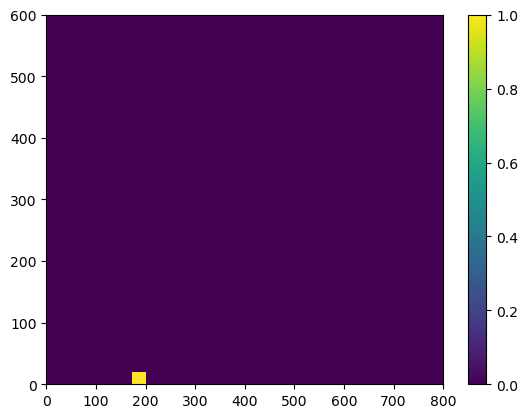

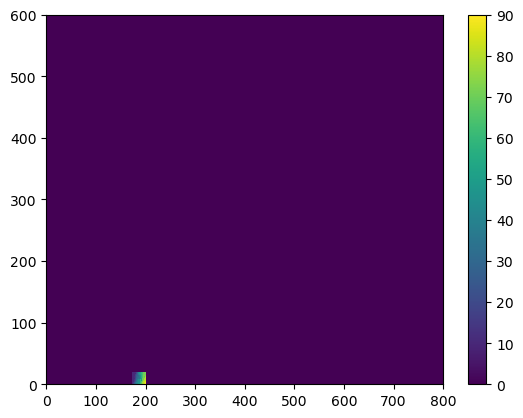

Old Max Roughness value is:  0.23809029101550264


DeltaBathymetry =  0.0
New Max Roughness value is:  0.05060833330310546


In [ ]:
# do same near shelf break
mask_break = np.ones_like(hhh)
mask_break[:,330:]=False
mask_break[hhh<90]=False

plt.pcolormesh(mask_break)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_break*hhh)
plt.colorbar()
plt.show()


# smooth the wct and bed, then deepen the ice to correct for smoothed wct/bed.
rx0in = 0.1
max_iter = 100
Area = 1/(pm*pn)
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_break,hhh,rx0in,Area,max_iter)

# make mask for deep ocean seamounts
mask_deepoceanmounts = np.ones_like(hhh)
mask_deepoceanmounts[:,0:330]=False
plt.pcolormesh(mask_deepoceanmounts)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_deepoceanmounts*hhh)
plt.colorbar()
plt.show()

# smooth the wct 
rx0in = 0.1
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_deepoceanmounts,hhh_tmp,rx0in,Area,max_iter)

# do same near boundaries
mask_deepoceanbnds = np.ones_like(hhh)
mask_deepoceanbnds[25:-25,:-35]=False
mask_deepoceanbnds[:,:-330]=False # smooth more of the far eastern seamounts

plt.pcolormesh(mask_deepoceanbnds)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_deepoceanbnds*hhh)
plt.colorbar()
plt.show()

# smooth the wct
rx0in = 0.05
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_deepoceanbnds,hhh_tmp,rx0in,Area,max_iter)


# do same near fraser island shelf break
mask_fraserbreak = np.ones_like(hhh)
mask_fraserbreak[:500,:]=False
# mask_fraserbreak[hhh<20]=False
mask_fraserbreak[:,300:]=False

plt.pcolormesh(mask_fraserbreak)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_fraserbreak*hhh)
plt.colorbar()
plt.show()

# smooth the wct
rx0in = 0.1
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_fraserbreak,hhh_tmp,rx0in,Area,max_iter)


# do same near far east/mid domain seamounts
mask_guyots = np.zeros_like(hhh)
mask_guyots[275:375,750:]=True

plt.pcolormesh(mask_guyots)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_guyots*hhh)
plt.colorbar()
plt.show()

# smooth the wct
rx0in = 0.05
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_guyots,hhh_tmp,rx0in,Area,max_iter)


# do same near far south/east domain seamounts
mask_guyots2 = np.zeros_like(hhh)
mask_guyots2[0:100,740:]=True

plt.pcolormesh(mask_guyots2)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_guyots2*hhh)
plt.colorbar()
plt.show()

# smooth the wct
rx0in = 0.1
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_guyots2,hhh_tmp,rx0in,Area,max_iter)


# do same near far south shelf break
mask_southbreak = np.zeros_like(hhh)
mask_southbreak[0:180,200:275]=True

plt.pcolormesh(mask_southbreak)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_southbreak*hhh)
plt.colorbar()
plt.show()

# smooth the wct
rx0in = 0.1
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_southbreak,hhh_tmp,rx0in,Area,max_iter)


# do same near far large guyot in middle
mask_midguyot = np.zeros_like(hhh)
mask_midguyot[450:525,300:375]=True

plt.pcolormesh(mask_midguyot)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_midguyot*hhh)
plt.colorbar()
plt.show()

# smooth the wct
rx0in = 0.1
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_midguyot,hhh_tmp,rx0in,Area,max_iter)



# do same near far southern border at coastline
mask_sthBorder = np.zeros_like(hhh)
mask_sthBorder[0:20,172:200]=True

plt.pcolormesh(mask_sthBorder)
plt.colorbar()
plt.show()
plt.pcolormesh(mask_sthBorder*hhh)
plt.colorbar()
plt.show()

# smooth the wct
rx0in = 0.05
max_iter = 100
Area = 1/(pm*pn)
hhh_tmp = hhh_smoothed
hhh_smoothed, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(mask_sthBorder,hhh_tmp,rx0in,Area,max_iter)

  
Minimum r-value =  0.0
Maximum r-value =  33.180549517769066
Mean    r-value =  2.4480564851416546
Median  r-value =  0.0
(0,)


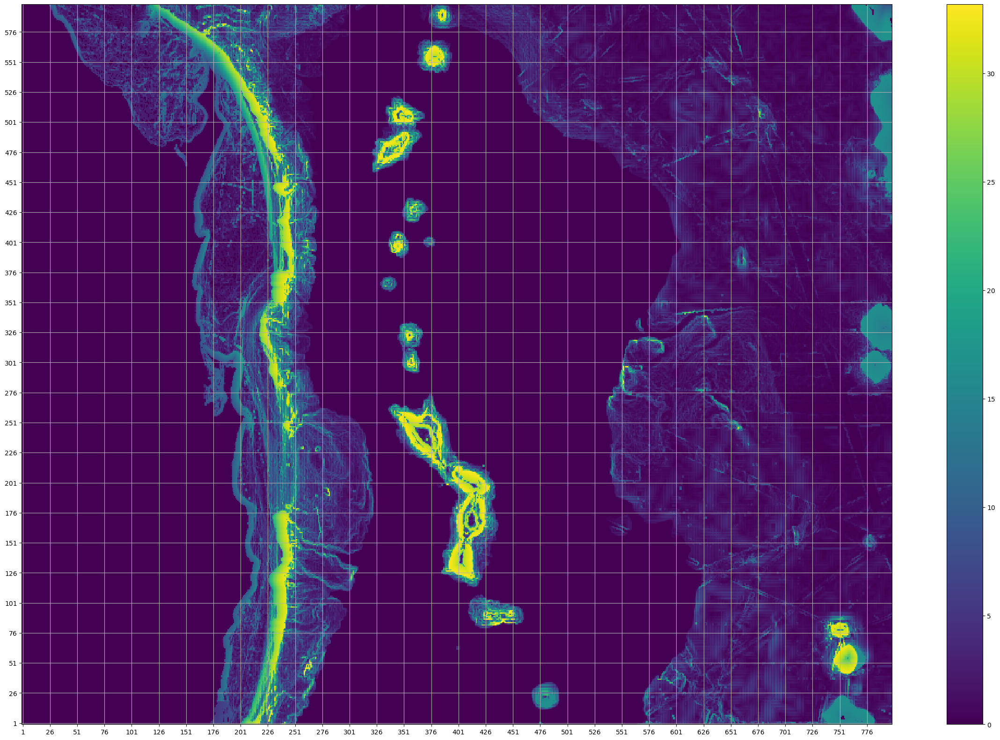

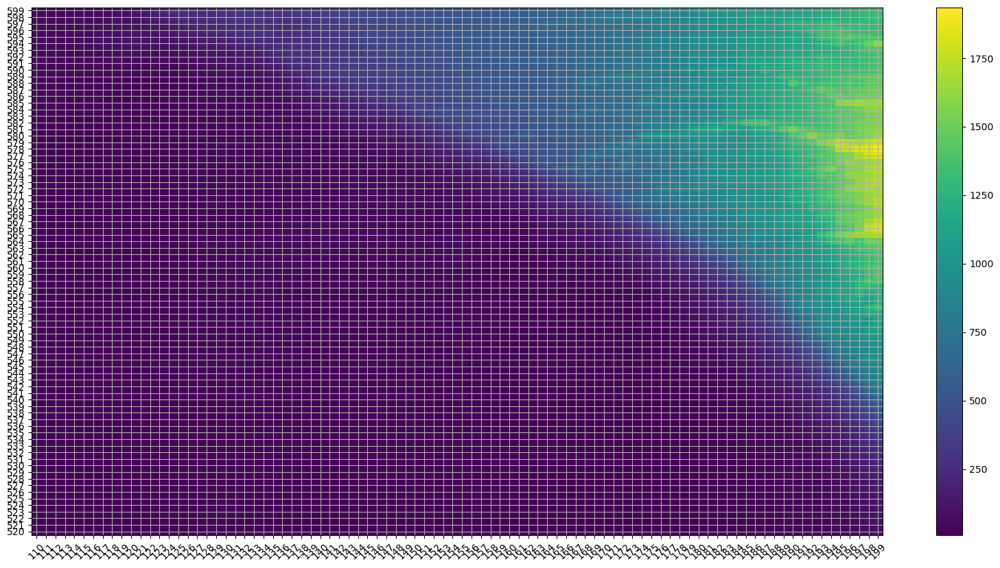

In [ ]:
seeBigPicture=True
focusRange=(110,200,520,600)

z_rho_test,z_w_test,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,hhh_smoothed,np.zeros(roms_tmp['bed'].shape))
grd_rx1_test=GridStiffness.rx1(z_w_test,mmm)
max_vals_vals=grd_rx1_test[grd_rx1_test>searchForValrx1]
max_vals_y,max_vals_x=np.nonzero(grd_rx1_test>searchForValrx1)
print(max_vals_vals.shape)
fig = plt.figure(figsize=(30,20))
plt.pcolormesh(grd_rx1_test)
plt.grid()
plt.plot(max_vals_x,max_vals_y,'ro')

if seeBigPicture==False:
    plt.yticks(np.arange(1,600,1),np.arange(1.5,600,1))
    plt.xticks(np.arange(1,800,1),np.arange(1.5,800,1),rotation=45)
    plt.xlim(focusRange[0],focusRange[1])
    plt.ylim(focusRange[2],focusRange[3])
else:
    plt.yticks(np.arange(1,600,25),np.arange(1,600,25))
    plt.xticks(np.arange(1,800,25),np.arange(1,800,25))
    for x,y,t in zip(max_vals_x,max_vals_y,max_vals_vals):
        plt.text(x,y,str(x)+','+str(y)+','+str(round(t)),ha='left',fontsize=16)
plt.colorbar()
plt.show()

fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()    
plt.clim((hhh[focusRange[2]:focusRange[3],focusRange[0]:focusRange[1]].min(),hhh[focusRange[2]:focusRange[3],focusRange[0]:focusRange[1]].max()))
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()

hhh = hhh_smoothed

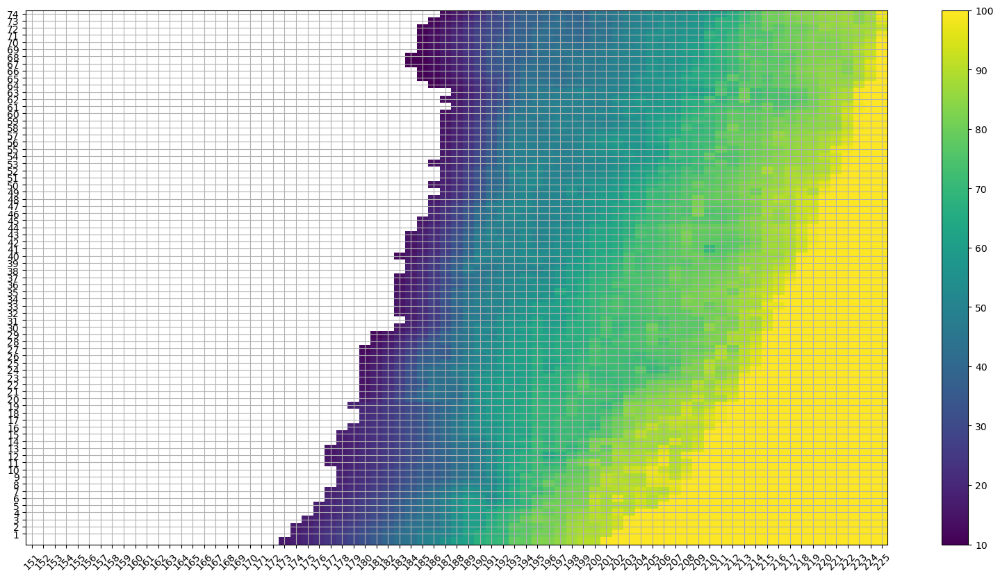

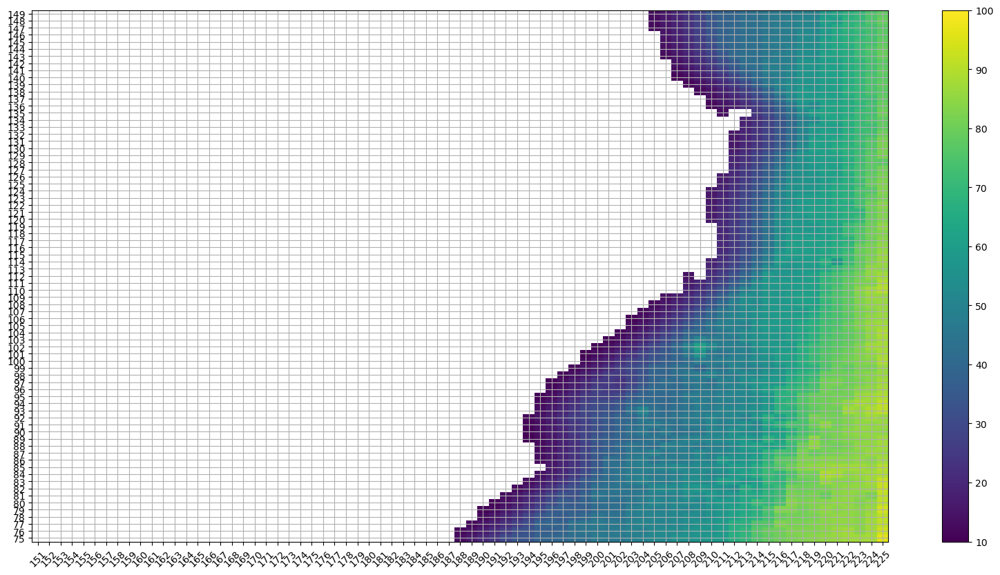

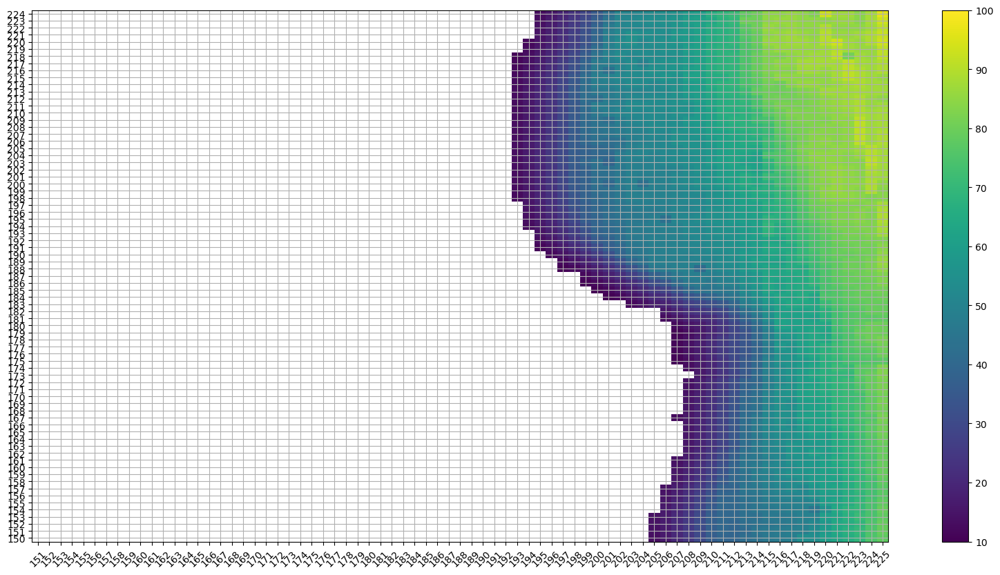

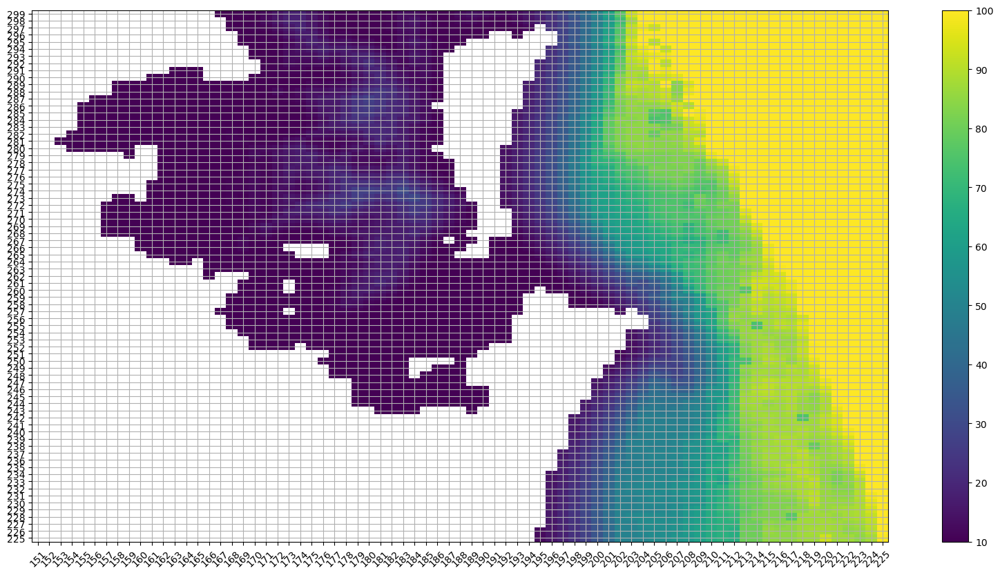

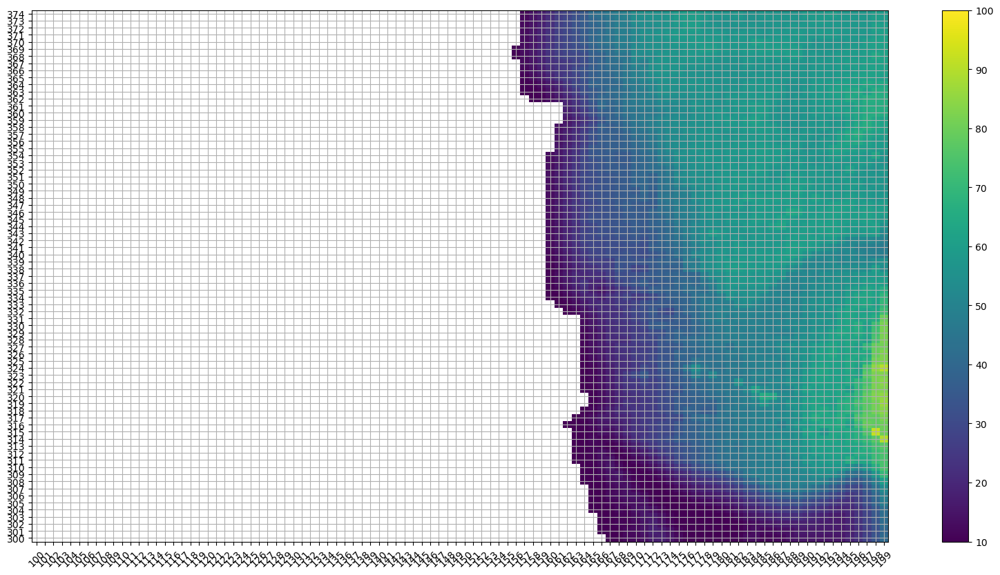

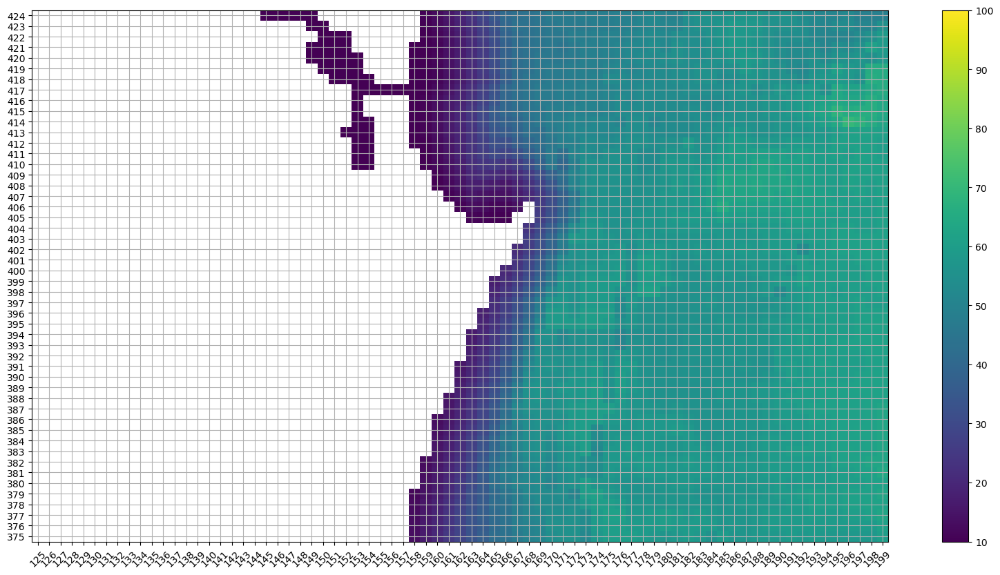

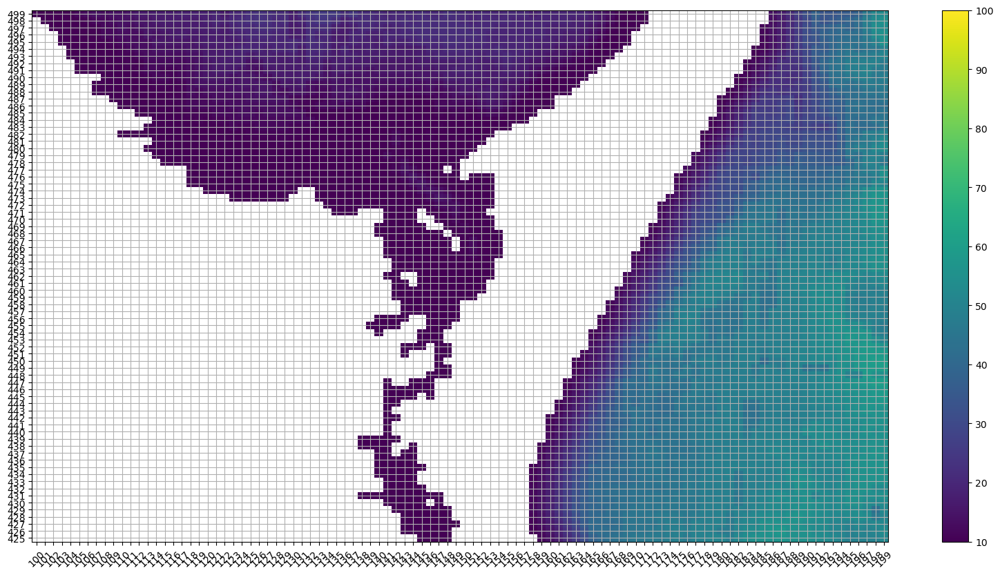

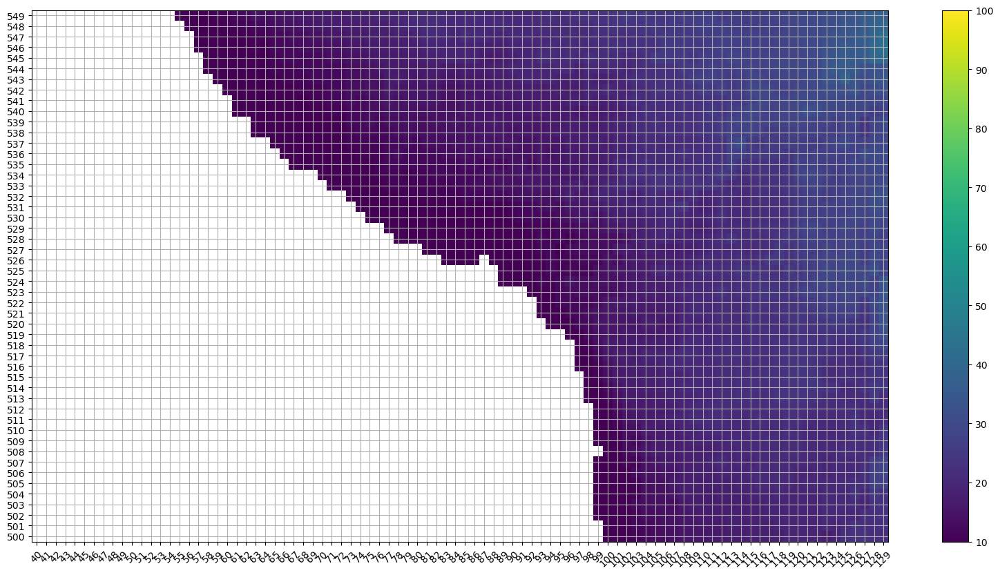

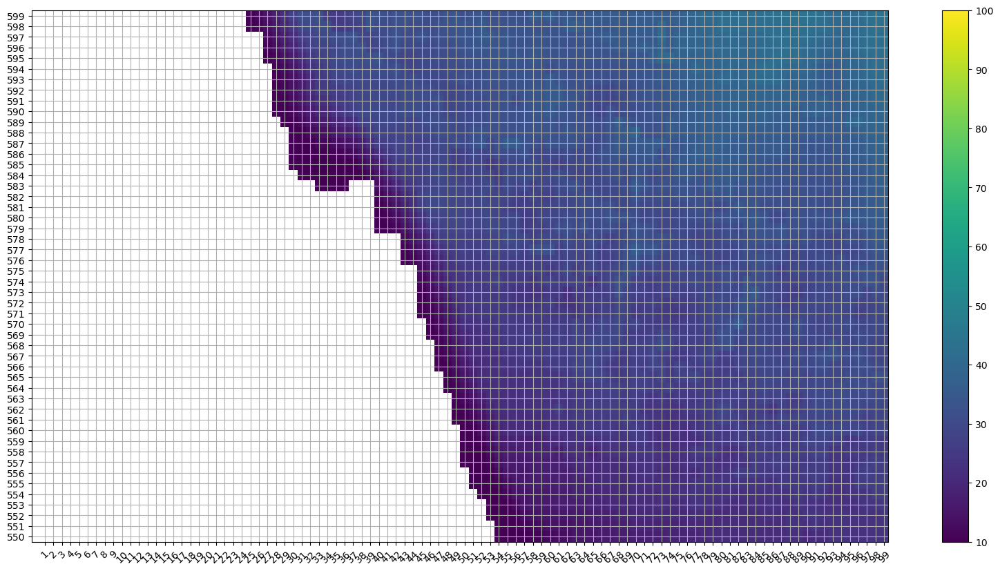

In [ ]:
# Make plots along the coast line
focusRange=(151,226,0,75)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()


focusRange=(151,226,75,150)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()



focusRange=(151,226,150,225)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()

focusRange=(151,226,225,300)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()
        
focusRange=(100,200,300,375)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()

focusRange=(125,200,375,425)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()

focusRange=(100,200,425,500)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()   
    
focusRange=(40,130,500,550)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()      

focusRange=(0,100,550,600)
fig = plt.figure(figsize=(20,10))
plt.pcolormesh(hhh*mmmNaN,vmax=100)
plt.grid()
plt.yticks(np.arange(1.5,600,1),np.arange(1,600,1))
plt.xticks(np.arange(1.5,800,1),np.arange(1,800,1),rotation=45)
# plt.plot(np.arange([340,370]),np.ones(np.arange([340,370]).shape)*112)
plt.colorbar()
plt.xlim(focusRange[0],focusRange[1])
plt.ylim(focusRange[2],focusRange[3])
plt.show()           

In [ ]:
# Remove single cell water "lakes"


from contextlib import suppress

def compare_neighbors(arr):
# # test example:
# arr = np.array([[False, False, False, False, False, False],
#                 [False, True, False, True, False, False],
#                 [False, False, False, False, True, False],
#                 [True, False, False, True, True, False],
#                 [False, True, True, True, False, False],
#                 [False, True, False, True, False, False],
#                 [False, True, True, True, False, False]])

    comp_arr = np.full(arr.shape, False, dtype=bool)

    for (x, y), item in np.ndenumerate(arr):
        # print(x,y)
        # print(x,y,arr.shape[0],arr.shape[1])
        # print((x<arr.shape[0]) & (y<arr.shape[1]))
        if (x>0) & (y>0) & (x<arr.shape[0]-1) & (y<arr.shape[1]-1):
            # print(x,y)
            if (arr[x-1, y] != item) & (arr[x+1, y] != item) & (arr[x, y+1] != item) & (arr[x, y-1] != item):
                if (arr[x-1, y-1] != item) & (arr[x+1, y-1] != item) & (arr[x-1, y+1] != item) & (arr[x+1, y+1] != item):
                    comp_arr[x, y] = True # Isolated cells are set to True
                if ((arr[x-1, y-1] == item) & (arr[x+1, y-1] != item) & (arr[x-1, y+1] != item) & (arr[x+1, y+1] != item)) |\
                    ((arr[x-1, y-1] != item) & (arr[x+1, y-1] == item) & (arr[x-1, y+1] != item) & (arr[x+1, y+1] != item)) |\
                    ((arr[x-1, y-1] != item) & (arr[x+1, y-1] != item) & (arr[x-1, y+1] == item) & (arr[x+1, y+1] != item)) |\
                    ((arr[x-1, y-1] != item) & (arr[x+1, y-1] != item) & (arr[x-1, y+1] != item) & (arr[x+1, y+1] == item)):
                    comp_arr[x, y] = True # find diagonal single cells
    return comp_arr


islands = compare_neighbors(mask)

mmm_noSS = mask.copy()

islandBehaviour = 'keep_islands' #'keep_islands' or 'remove_islands'
if islandBehaviour=='remove_islands':
    mmm_noSS[islands] = np.logical_not(mmm_noSS[islands]) # flip sign on only the islands
elif islandBehaviour=='keep_islands':
    mmm_noSS[islands] = np.full(mmm_noSS[islands].shape,False) # flip sign on only the islands



mask = mmm_noSS

In [ ]:
# calculate final rx0 and rx1 values

z_rho_final,z_w_final,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,hhh,np.zeros(roms_tmp['bed'].shape))
grd_rx0_final=GridStiffness.rx0(hhh,mmm)

grd_rx1_final=GridStiffness.rx1(z_w_final,mmm)



  
Minimum r-value =  0.0
Maximum r-value =  0.11001986023381626
Mean    r-value =  0.009543386513715783
Median  r-value =  0.0
  
Minimum r-value =  0.0
Maximum r-value =  33.180549517769066
Mean    r-value =  2.4480564851416546
Median  r-value =  0.0


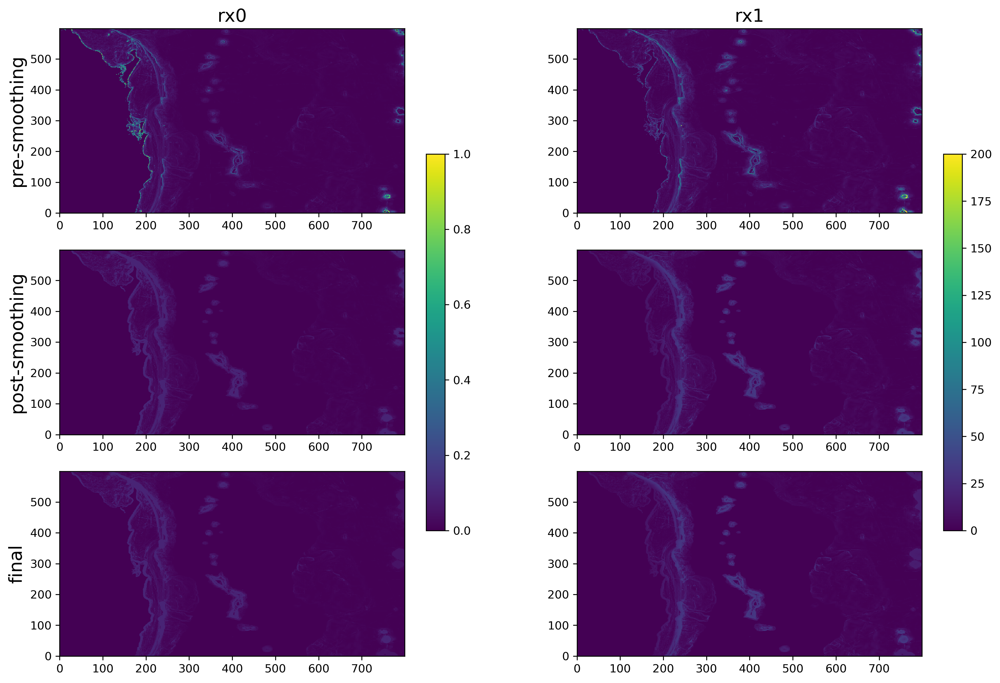

In [ ]:

fig,axs = plt.subplots(3,2,figsize=[15,10],dpi=300)

ax = axs[0,0]
ax.pcolormesh(grd_rx0_pre,vmax=1)
ax.set_title('rx0',fontsize=16)
ax.set_ylabel('pre-smoothing',fontsize=16)
ax = axs[0,1]
grd_rx1_pre[np.isnan(grd_rx1_pre)]=0
ax.pcolormesh(grd_rx1_pre,vmax=200)
ax.set_title('rx1',fontsize=16)
ax = axs[1,0]
im=ax.pcolormesh(grd_rx0_post,vmax=1)
ax.set_ylabel('post-smoothing',fontsize=16)
ax = axs[1,1]
im=ax.pcolormesh(grd_rx1_post,vmax=200)
ax = axs[2,0]
im=ax.pcolormesh(grd_rx0_final,vmax=1)
plt.colorbar(im,ax=axs[:,0],shrink=0.6)
ax.set_ylabel('final',fontsize=16)
ax = axs[2,1]
im=ax.pcolormesh(grd_rx1_final,vmax=200)
plt.colorbar(im,ax=axs[:,1],shrink=0.6)


plt.savefig('../out/pre_post_rxVals.png')

In [ ]:
# # calculate final rx0 and rx1 values, check that you're happy before overwriting these
# z_rho_final,z_w_final,=GridStiffness.calc_z(Vtransform,Vstretching,theta_s,theta_b,Tcline,hc,N,hhh,zzz)
# grd_rx0_final=GridStiffness.rx0(hhh,mmm)

# grd_rx1_final=GridStiffness.rx1(z_w_final,mmm)


In [ ]:
# # third round of smoothing, pulling rx0 down to something more reasonable
# hhh_final, HmodifVal, ValueFct = smoothing_PlusMinus_rx0(np.ones_like(wct),hhh,rx0in,Area,max_iter)
# zzz_final = zzz.copy()
# # now re-check that min_depth is obeyed for all ocean points
# ii = ((hhh_final + zzz_final) < min_depth) & (mask == 1)
# hhh_final[ii] = -zzz_final[ii] + min_depth

# # do the same for all non-ocean points
# ii = ((hhh_final + zzz_final) < min_depth) & (mask == 0)
# zzz_final[ii] = min_depth-hhh_final[ii] # for those locations, the depth needs to be min_depth above the bathy


## otherwise just update names of hhh adn mm to _final

mmm_final = mmm.copy()
hhh_final = hhh.copy()


In [ ]:
# # remove any zice that is >0.
# zzz_final_backup = zzz_final.copy()

# anyPosZice=np.any(zzz_final>0)

# if anyPosZice:
#     new_ice = zzz_final.copy()
#     new_ice[(zzz_final>0)]=0
#     zzz_final=new_ice.copy()


In [ ]:
# maskNaN = mmm.copy().astype('float')
# maskNaN[maskNaN == 0] = np.NaN

# print('whole domain')
# print('min/max zice is',zzz_final.min(),'/',zzz_final.max())
# print('min/max h is',hhh_final.min(),'/',hhh_final.max())
# print('min/max wct is',(hhh_final+zzz_final).min(),'/',(hhh_final+zzz_final).max())
# print('ocean cells')
# print('min/max zice is',np.nanmin(zzz_final*maskNaN),'/',np.nanmax(zzz_final*maskNaN))
# print('min/max h is',np.nanmin(hhh_final*maskNaN),'/',np.nanmax(hhh_final*maskNaN))
# print('min/max wct is',np.nanmin((hhh_final+zzz_final)*maskNaN),'/',np.nanmax((hhh_final+zzz_final)*maskNaN))

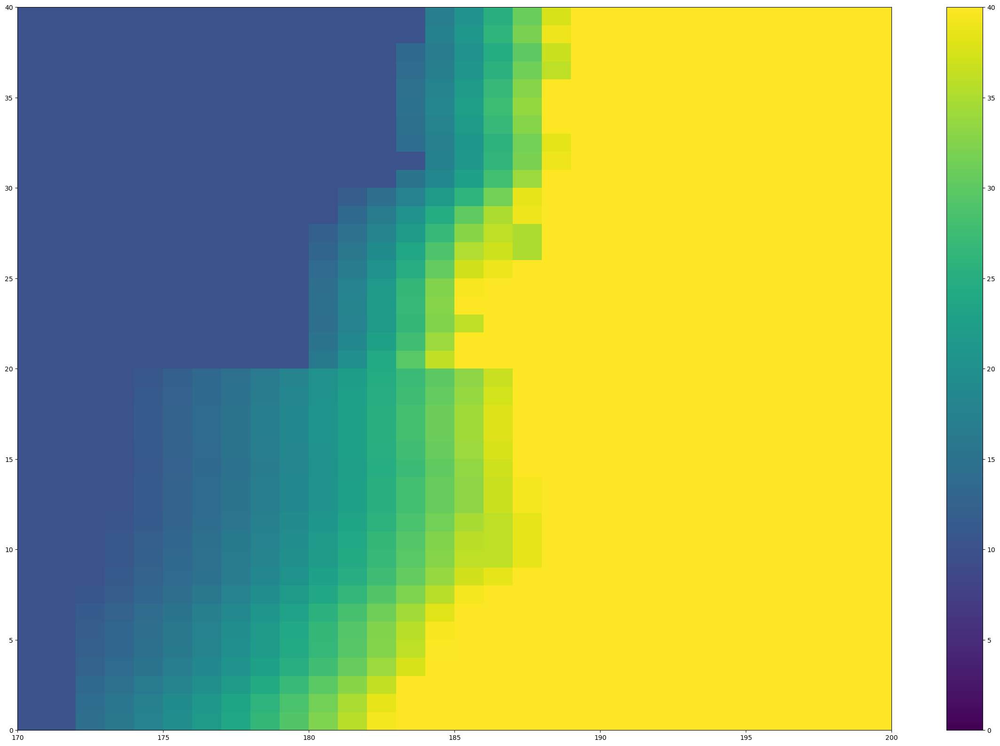

[]


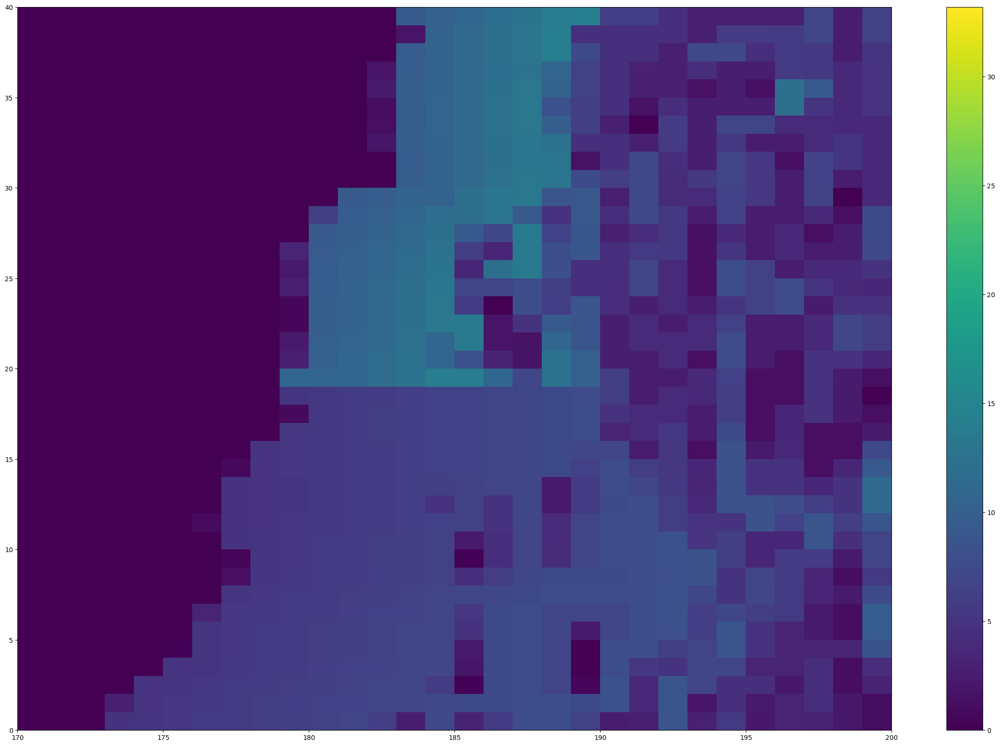

In [ ]:
fig = plt.figure(figsize=(30,20))
plt.pcolormesh(hhh_final,vmin=0,vmax=40)
plt.colorbar()
plt.xlim(170,200)
plt.ylim(0,40)
plt.show()
fig = plt.figure(figsize=(30,20))
plt.pcolormesh(grd_rx1_final)
plt.colorbar()
max_vals_y,max_vals_x=np.nonzero(grd_rx1_final>50)
max_vals_vals=grd_rx1_final[grd_rx1_final>50]
plt.plot(max_vals_x,max_vals_y,'ro')
plt.xlim(170,200)
plt.ylim(0,40)
print(max_vals_vals)


In [ ]:
np.mean(hhh_final[2:14,184:190])

43.57616077591251

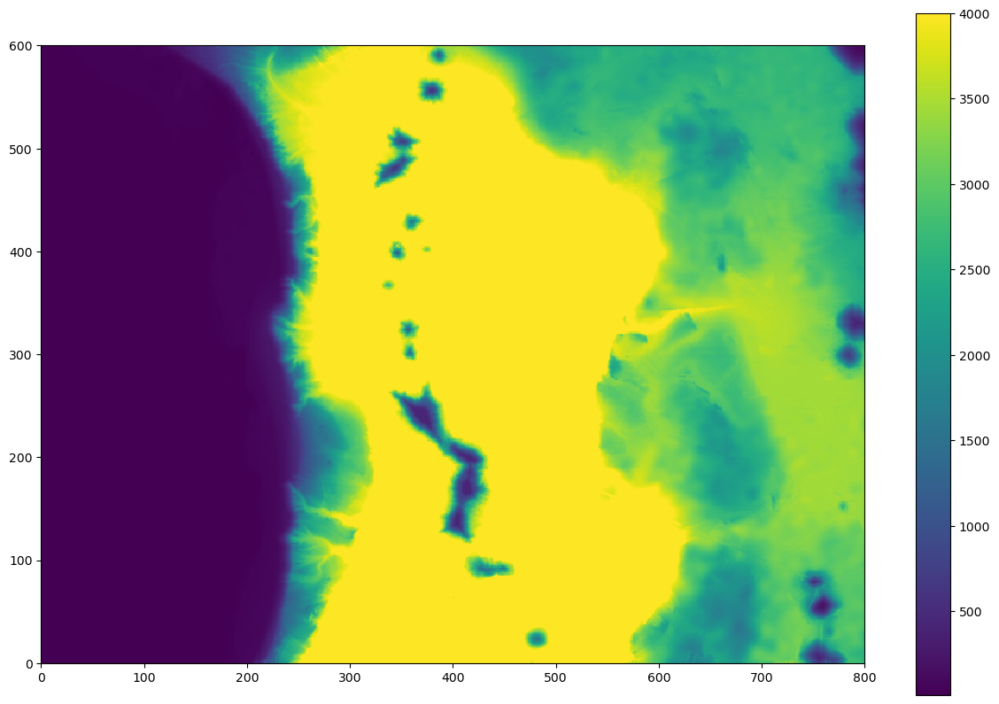

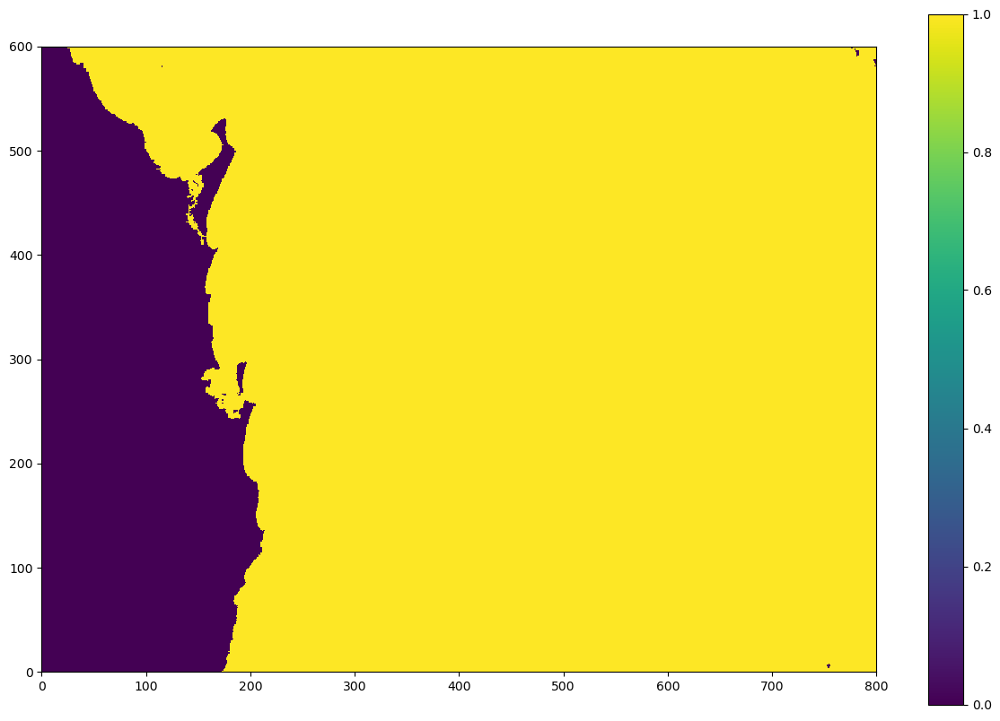

In [ ]:

fig,ax = plt.subplots(figsize=(15,10))
plot = ax.pcolormesh(hhh_final)        

plt.colorbar(plot,ax=ax)
ax.set_aspect('equal')
plt.show()


fig,ax = plt.subplots(figsize=(15,10))
plot = ax.pcolormesh(mmm_final)        

plt.colorbar(plot,ax=ax)
ax.set_aspect('equal')
plt.show()

In [ ]:
# # good list of location names here: https://fishing-app.gpsnauticalcharts.com/i-boating-fishing-web-app/fishing-marine-charts-navigation.html#6.67/-27.456/-203.567
# In top right of domain: Kelso Bank
# In bot right of domain: Lord Howe Is.

In [ ]:
# if happy with above, update hhh
hhh = hhh_final.copy()
mmm = mmm_final.copy()

In [ ]:
# if this is set as 'True', then overwrite the bed, ice and mask with updated values.

handAdjustments=True
if handAdjustments:
    print('updating bathy, zice and mask')
    roms_tmp['bed_backup'] = roms_tmp['bed'].copy()
    # roms_tmp['ice_backup'] = roms_tmp['ice'].copy()
    roms_tmp['mask_backup'] = roms_tmp['mask'].copy()
    roms_tmp['bed']=hhh.copy()
    # roms_tmp['ice']=zzz.copy()
    roms_tmp['mask']=mmm.copy()
    
    bed = hhh.copy()
    # ice = zzz.copy()
    mask = mmm.copy()


updating bathy, zice and mask


In [ ]:
# do checks

maskNaN = mask.copy().astype('float')
maskNaN[maskNaN == 0] = np.NaN

print('whole domain')
print('min/max h is',bed.min(),'/',bed.max())
print('ocean cells')
print('min/max h is',np.nanmin(bed*maskNaN),'/',np.nanmax(bed*maskNaN))


whole domain
min/max h is 10.0 / 4000.0
ocean cells
min/max h is 10.0 / 4000.0


In [ ]:
mask = mask.astype(float)
mindxy = min(np.hstack((1/pm.flatten(),1/pn.flatten())))
maskNaN = mask.copy()
maskNaN[mask==0]=np.nan
CFL = mindxy/abs(np.sqrt(9.81*bed))*maskNaN

print('max fast DT in s following CFL: ', np.nanmin(CFL))
print('max slow DT in s following CFL: ', np.nanmin(mindxy/8*maskNaN)) # approx max 8m/s baroclinic wave speed
print('Set ROMS timestep settings of at least: \n','DT <',np.nanmin(mindxy/8*maskNaN),'s \n NDTFAST >',(np.nanmin(mindxy/8*maskNaN)/np.nanmin(CFL)).round())
timescale = 12*60*60 #s
print('approximate viscosity settings for smoothing timescale of ',timescale/(60*60),' hrs')
print('visc2 for 2dx noise ~ ',(2*mindxy/(2*np.pi))**2 / timescale)
print('approximate diff settings are an order of magnitude lower:')
print('tnu2 ~ ',((2*mindxy/(2*np.pi))**2 / timescale/10))

max fast DT in s following CFL:  4.861530154304082
max slow DT in s following CFL:  120.37810330326099
Set ROMS timestep settings of at least: 
 DT < 120.37810330326099 s 
 NDTFAST > 25.0
approximate viscosity settings for smoothing timescale of  12.0  hrs
visc2 for 2dx noise ~  2.1751613323759584
approximate diff settings are an order of magnitude lower:
tnu2 ~  0.21751613323759583


Im really not sure if this is correct!


Text(0.5, 1.0, 'angle [converted to degrees] between XI-axis and EAST')

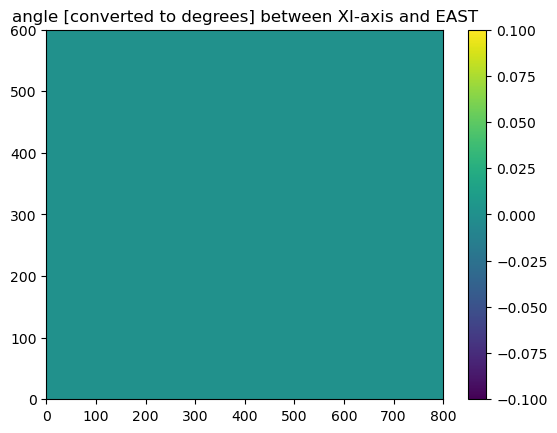

In [ ]:
# Calculate the grid angle. !Important!

# angle = lon_rho/180.0*np.pi
# ^^ only works for the polar stereographic grid of the Ole style WAOM model.

# From Charles James GridBuilder:

_,dxdxi = np.gradient(lon_rho)
_,dydxi = np.gradient(lat_rho)

angle = np.arctan2(dydxi,dxdxi)
print('I''m really not sure if this is correct!')

plt.pcolormesh(np.rad2deg(angle))
plt.colorbar()
plt.title('angle [converted to degrees] between XI-axis and EAST')


In [ ]:
#set spherical flag to 1, since we're creating a curvilinear spherical grid
spherical_da = xr.DataArray('"T"',name='spherical',attrs={'flag_meanings': 'Cartesian spherical',
 'flag_values': np.array(['"F"', '"T"'], dtype=str),
 'long_name': 'grid type logical switch'})

xl = mr*np.size(lat_rho,1)*1000
xl_da = xr.DataArray(xl,name='xl',attrs={'long_name': 'basin length in the XI-direction', 'units': 'meter'} )
el = mr*np.size(lon_rho,0)*1000
el_da = xr.DataArray(el,name='el',attrs={'long_name': 'basin length in the ETA-direction', 'units': 'meter'} )

# angle = lon_rho/180.0*np.pi
angle_da = xr.DataArray(angle,name='angle',dims=['eta_rho','xi_rho'],attrs={'long_name': 'angle between XI-axis and EAST', 'units': 'radians'})

pn_da = xr.DataArray(pn,name="pn",dims=['eta_rho','xi_rho'],attrs={'long_name': 'curvilinear coordinate metric in ETA', 'units': 'meter-1'})
pm_da = xr.DataArray(pm,name='pm',dims=['eta_rho','xi_rho'],attrs={'long_name': 'curvilinear coordinate metric in XI', 'units': 'meter-1'})

dmde_da = xr.DataArray(dmde,name='dmde',dims=['eta_rho','xi_rho'],attrs={'long_name': 'ETA-derivative of inverse metric factor pm', 'units': 'meter'})
dndx_da = xr.DataArray(dndx,name='dndx',dims=['eta_rho','xi_rho'],attrs={'long_name': 'XI-derivative of inverse metric factor nm', 'units': 'meter'})

f = 2*7.29e-5*np.sin(lat_rho*np.pi/180)
f_da = xr.DataArray(f,name='f',dims=['eta_rho','xi_rho'],attrs={'long_name': 'Coriolis parameter at RHO-points', 'units': 'second-1'})

h_da = xr.DataArray(bed,name='h',dims=['eta_rho','xi_rho'],attrs={'long_name': 'model bathymetry at RHO-points', 'units': 'meter'})


lon_rho_da = xr.DataArray(lon_rho,name='lon_rho',dims=['eta_rho','xi_rho'],attrs={'long_name': 'longitude of RHO-points',
 'standard_name': 'longitude',
 'units': 'degree_east'})
lat_rho_da = xr.DataArray(lat_rho,name='lat_rho',dims=['eta_rho','xi_rho'],attrs={'long_name': 'latitude of RHO-points',
 'standard_name': 'latitude',
 'units': 'degree_north'})
lon_psi_da = xr.DataArray(lon_psi,name='lon_psi',dims=['eta_psi','xi_psi'],attrs={'long_name': 'longitude of psi-points',
 'standard_name': 'longitude',
 'units': 'degree_east'})
lat_psi_da = xr.DataArray(lat_psi,name='lat_psi',dims=['eta_psi','xi_psi'],attrs={'long_name': 'latitude of psi-points',
 'standard_name': 'latitude',
 'units': 'degree_north'})
lon_u_da = xr.DataArray(lon_u,name='lon_u',dims=['eta_u','xi_u'],attrs={'long_name': 'longitude of u-points',
 'standard_name': 'longitude',
 'units': 'degree_east'})
lat_u_da = xr.DataArray(lat_u,name='lat_u',dims=['eta_u','xi_u'],attrs={'long_name': 'latitude of u-points',
 'standard_name': 'latitude',
 'units': 'degree_north'})
lon_v_da = xr.DataArray(lon_v,name='lon_v',dims=['eta_v','xi_v'],attrs={'long_name': 'longitude of v-points',
 'standard_name': 'longitude',
 'units': 'degree_east'})
lat_v_da = xr.DataArray(lat_v,name='lat_v',dims=['eta_v','xi_v'],attrs={'long_name': 'latitude of v-points',
 'standard_name': 'latitude',
 'units': 'degree_north'})


mask_u,mask_v,mask_psi = uvp_masks(mask)

mask_rho_da = xr.DataArray(mask,name='mask_rho',dims=['eta_rho','xi_rho'],attrs={'flag_meanings': 'land water',
 'flag_values': np.array([ 0.,  1.]),
 'long_name': 'mask on RHO-points'})
mask_psi_da = xr.DataArray(mask_psi,name='mask_psi',dims=['eta_psi','xi_psi'],attrs={'flag_meanings': 'land water',
 'flag_values': np.array([ 0.,  1.]),
 'long_name': 'mask on psi-points'})
mask_u_da = xr.DataArray(mask_u,name='mask_u',dims=['eta_u','xi_u'],attrs={'flag_meanings': 'land water',
 'flag_values': np.array([ 0.,  1.]),
 'long_name': 'mask on u-points'})
mask_v_da = xr.DataArray(mask_v,name='mask_v',dims=['eta_v','xi_v'],attrs={'flag_meanings': 'land water',
 'flag_values': np.array([ 0.,  1.]),
 'long_name': 'mask on v-points'})

grd = xr.Dataset({'spherical':spherical_da,
                'xl':xl_da,
                'el':el_da,
                'angle':angle_da,
                'pm':pn_da,
                'pn':pn_da,
                'dndx':dndx_da,
                'dmde':dmde_da,
                'f':f_da,
                'h':h_da,
              #   'hraw':hraw_da,
                # 'zice':zice_da,
              #   'zice_raw':zice_raw_da,
                'lon_rho':lon_rho_da,
                'lat_rho':lat_rho_da,
                'lon_psi':lon_psi_da,
                'lat_psi':lat_psi_da,
                'lon_u':lon_u_da,
                'lat_u':lat_u_da,
                'lon_v':lon_v_da,
                'lat_v':lat_v_da,
                'mask_rho':mask_rho_da,
                'mask_psi':mask_psi_da,
                'mask_u':mask_u_da,
                'mask_v':mask_v_da,},
               attrs={'history': 'GRID file using make_grid.py,'+str(datetime.date.today()),
                      'type': 'ROMS grid file'})

In [ ]:
print('saving to',out_path)
grd.to_netcdf(out_path,unlimited_dims='bath')

saving to /home/woden/Documents/se-qld-setup/data/proc/seqld_1km_fixedMB_fixSthBnd_grd.nc
